# **Enhanced Small Lung Tumor Segmentation Using Modified 3D U-Net with Transfer Learning and Optimization**

## Setup environment

In [13]:
!python -c "import monai" || pip install -q "monai-weekly[gdown, nibabel, tqdm, ignite]"
!python -c "import matplotlib" || pip install -q matplotlib
%matplotlib inline

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


2024-08-28 16:55:00.391229: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-28 16:55:00.391291: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-28 16:55:00.392652: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## Setup imports

In [14]:
from monai.utils import first, set_determinism
from monai.transforms import (
    AsDiscrete,
    AsDiscreted,
    EnsureChannelFirstd,
    Compose,
    CropForegroundd,
    LoadImaged,
    Orientationd,
    RandCropByPosNegLabeld,
    SaveImaged,
    ScaleIntensityRanged,
    Spacingd,
    Invertd,
    RandAffined
)
from monai.handlers.utils import from_engine
from monai.networks.nets import UNet
from monai.networks.layers import Norm
from monai.metrics import DiceMetric
from monai.losses import DiceLoss
from monai.inferers import sliding_window_inference
from monai.data import CacheDataset, DataLoader, Dataset, decollate_batch
from monai.config import print_config
from monai.apps import download_and_extract
import torch
import matplotlib.pyplot as plt
import tempfile
import shutil
import os
import glob

print_config()

MONAI version: 1.4.dev2434
Numpy version: 1.26.4
Pytorch version: 2.1.2
MONAI flags: HAS_EXT = False, USE_COMPILED = False, USE_META_DICT = False
MONAI rev id: dc611d231ba670004b1da1b011fe140375fb91af
MONAI __file__: /opt/conda/lib/python3.10/site-packages/monai/__init__.py

Optional dependencies:
Pytorch Ignite version: 0.4.11
ITK version: NOT INSTALLED or UNKNOWN VERSION.
Nibabel version: 5.2.1
scikit-image version: 0.22.0
scipy version: 1.11.4
Pillow version: 9.5.0
Tensorboard version: 2.15.1
gdown version: 5.2.0
TorchVision version: 0.16.2
tqdm version: 4.66.4
lmdb version: NOT INSTALLED or UNKNOWN VERSION.
psutil version: 5.9.3
pandas version: 2.2.2
einops version: NOT INSTALLED or UNKNOWN VERSION.
transformers version: 4.42.3
mlflow version: NOT INSTALLED or UNKNOWN VERSION.
pynrrd version: NOT INSTALLED or UNKNOWN VERSION.
clearml version: NOT INSTALLED or UNKNOWN VERSION.

For details about installing the optional dependencies, please visit:
    https://docs.monai.io/en/latest/

## Set Lung-tumour dataset path

In [16]:
data_dir = "/kaggle/input/lung-tumor-segment/data"
train_images = sorted(glob.glob(os.path.join(data_dir, "imagesTr", "*.nii")))
train_labels = sorted(glob.glob(os.path.join(data_dir, "labelsTr", "*.nii")))
data_dicts = [{"image": image_name, "label": label_name} for image_name, label_name in zip(train_images, train_labels)]
train_files, val_files = data_dicts[:-9], data_dicts[-9:]

## Set deterministic training for reproducibility

In [17]:
set_determinism(seed=0)

## Setup transforms for training and validation



In [18]:
from monai.transforms import (
    Compose, LoadImaged, EnsureChannelFirstd, ScaleIntensityRanged, CropForegroundd, 
    Orientationd, Spacingd, RandCropByPosNegLabeld, RandAffined, RandFlipd, RandRotate90d, 
    RandGaussianNoised, RandGaussianSmoothd, RandZoomd, RandShiftIntensityd
)

train_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"]),
        EnsureChannelFirstd(keys=["image", "label"]),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=-1000,
            a_max=500,
            b_min=0.0,
            b_max=1.0,
            clip=True,
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        Orientationd(keys=["image", "label"], axcodes="LPS"),
        Spacingd(keys=["image", "label"], pixdim=(1.5, 1.5, 2.0), mode=("bilinear", "nearest")),
        RandCropByPosNegLabeld(
            keys=["image", "label"],
            label_key="label",
            spatial_size=(96, 96, 96),
            pos=1,
            neg=1,
            num_samples=4,
            image_key="image",
            image_threshold=0,
        ),
        RandAffined(
            keys=["image", "label"],
            mode=("bilinear", "nearest"),
            prob=1.0,
            spatial_size=(96, 96, 96),
            rotate_range=(0.1, 0.1, 0.1),  # Slight rotations in all axes
            scale_range=(0.1, 0.1, 0.1),
            shear_range=(0.05, 0.05, 0.05),  # Adding shear
            translate_range=(10, 10, 10),   # Adding slight translations
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[0],  # Flipping along the x-axis
            prob=0.5
        ),
        RandFlipd(
            keys=["image", "label"],
            spatial_axis=[1],  # Flipping along the y-axis
            prob=0.5
        ),
        RandRotate90d(
            keys=["image", "label"],
            prob=0.5,
            max_k=3,  # Rotating 90 degrees up to 3 times
        ),
        RandGaussianNoised(
            keys=["image"],
            prob=0.2,
            mean=0.0,
            std=0.1
        ),
        RandGaussianSmoothd(
            keys=["image"],
            prob=0.2,
            sigma_x=(0.5, 1.5),
            sigma_y=(0.5, 1.5),
            sigma_z=(0.5, 1.5)
        ),
        RandZoomd(
            keys=["image", "label"],
            min_zoom=0.9,
            max_zoom=1.1,
            prob=0.3,
            mode=("trilinear", "nearest")
        ),
        RandShiftIntensityd(
            keys=["image"],
            offsets=0.1,
            prob=0.5,
        ),
    ]
)

val_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"]),
        EnsureChannelFirstd(keys=["image", "label"]),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=-1000,
            a_max=500,
            b_min=0.0,
            b_max=1.0,
            clip=True,
        ),
        CropForegroundd(keys=["image", "label"], source_key="image"),
        Orientationd(keys=["image", "label"], axcodes="LPS"),
        Spacingd(keys=["image", "label"], pixdim=(1.5, 1.5, 2.0), mode=("bilinear", "nearest")),
    ]
)

/opt/conda/lib/python3.10/site-packages/monai/utils/deprecate_utils.py:321: FutureWarning: monai.transforms.croppad.dictionary CropForegroundd.__init__:allow_smaller: Current default value of argument `allow_smaller=True` has been deprecated since version 1.2. It will be changed to `allow_smaller=False` in version 1.5.
  warn_deprecated(argname, msg, warning_category)


## Check transforms in DataLoader

image shape: torch.Size([211, 211, 141]), label shape: torch.Size([211, 211, 141])


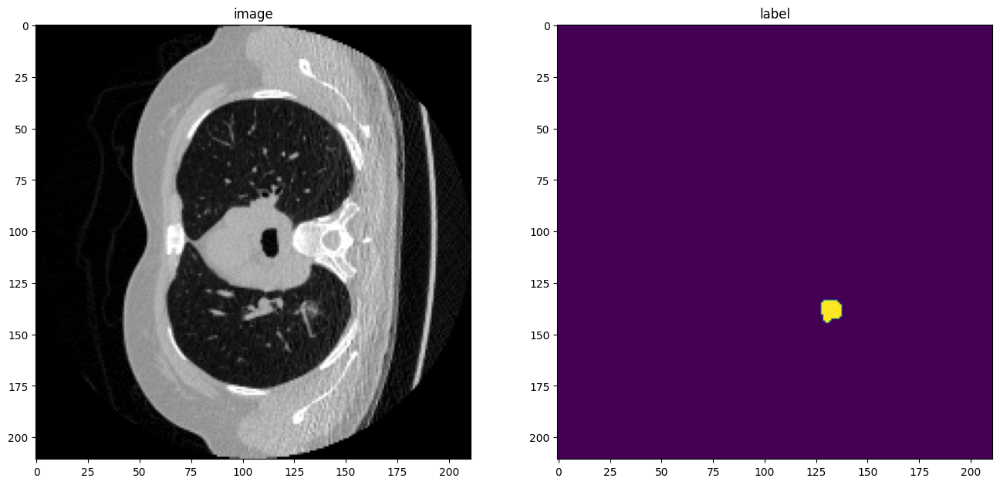

In [19]:
check_ds = Dataset(data=val_files, transform=val_transforms)
check_loader = DataLoader(check_ds, batch_size=1)
check_data = first(check_loader)
image, label = (check_data["image"][0][0], check_data["label"][0][0])
print(f"image shape: {image.shape}, label shape: {label.shape}")
# plot the slice [:, :, 80]
plt.figure("check", (16, 16))
plt.subplot(1, 2, 1)
plt.title("image")
plt.imshow(image[:, :, 100], cmap="gray")
plt.subplot(1, 2, 2)
plt.title("label")
plt.imshow(label[:, :, 100])
plt.show()

## Define CacheDataset and DataLoader for training and validation



In [20]:
train_ds = CacheDataset(data=train_files, transform=train_transforms, cache_rate=1.0, num_workers=4)
# train_ds = Dataset(data=train_files, transform=train_transforms)

# use batch_size=2 to load images and use RandCropByPosNegLabeld
# to generate 2 x 4 images for network training
train_loader = DataLoader(train_ds, batch_size=2, shuffle=True, num_workers=4)

val_ds = CacheDataset(data=val_files, transform=val_transforms, cache_rate=1.0, num_workers=1)
# val_ds = Dataset(data=val_files, transform=val_transforms)
val_loader = DataLoader(val_ds, batch_size=1, num_workers=1)

Loading dataset: 100%|██████████| 9/9 [00:57<00:00,  6.38s/it]


## Create Model, Loss, Optimizer

In [21]:
import torch
import torch.nn as nn
from monai.networks.nets import UNet
from monai.networks.blocks import ResBlock
from monai.networks.layers import Norm

#Replacing the final layer of Unet with a projection layer
class ConvProjection(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ConvProjection, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv3d(in_channels, 4, kernel_size=1),
            nn.ReLU(),
            nn.Conv3d(4, out_channels, kernel_size=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.conv(x)
    
#Modified UNet incorporating the projection layer

class ModifiedUNetWithProjections(nn.Module):
    def __init__(self, in_channels=1, out_channels=2):
        super(ModifiedUNetWithProjections, self).__init__()
        
        self.unet = UNet(
            spatial_dims=3,
            in_channels=in_channels, 
            out_channels=2, 
            channels=[16, 32, 64, 128, 256],
            strides=[2, 2, 2, 2],
            num_res_units=3,
            dropout=0.2,
            norm=Norm.BATCH,
        )
        
        self.unet.out_conv = ConvProjection(in_channels=8, out_channels=2) 
        
    def forward(self, x):
        unet_out = self.unet(x)
        
        return unet_out

model = ModifiedUNetWithProjections(in_channels=1, out_channels=2)  # Changed out_channels to 4

# Loading the pretrained U-Net weights
pretrained_weights = torch.load('/kaggle/input/spleen-ct/model.pt')

# Loading only the weights for the U-Net part of the model
model.unet.load_state_dict(pretrained_weights, strict=False)

# Utilizing DataParallel to use multiple GPUs
model = nn.DataParallel(model)

# Moving the model to CUDA (GPU)
model = model.to("cuda")

print(torch.cuda.device_count())

2


In [22]:
import torch
#Check the memory usage to consider resource contraints and avoid CUDA memory run-outs
print(f"Allocated memory: {torch.cuda.memory_allocated() / 1024 ** 2:.2f} MB")
print(f"Reserved memory: {torch.cuda.memory_reserved() / 1024 ** 2:.2f} MB")

Allocated memory: 486.29 MB
Reserved memory: 2264.00 MB


In [68]:
import torch

# Clear the GPU cache
torch.cuda.empty_cache()

## Execute a typical PyTorch training process

In [24]:
import os
import torch
import optuna
import numpy as np
import matplotlib.pyplot as plt
import csv
from monai.transforms import Compose, AsDiscrete
from monai.inferers import sliding_window_inference
from monai.data import decollate_batch
from monai.metrics import DiceMetric
from monai.losses import DiceLoss
from torch.optim.lr_scheduler import ReduceLROnPlateau
from sklearn.model_selection import KFold

# Device setting
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Combined Dice and Cross-Entropy Loss
class DiceCELoss(torch.nn.Module):
    def __init__(self, dice_weight=0.8, ce_weight=0.5):
        super(DiceCELoss, self).__init__()
        self.dice_weight = dice_weight
        self.ce_weight = ce_weight
        self.dice_loss = DiceLoss(to_onehot_y=True, softmax=True)
        self.ce_loss = torch.nn.CrossEntropyLoss()

    def forward(self, outputs, targets):
        dice_loss = self.dice_loss(outputs, targets)
        ce_loss = self.ce_loss(outputs, targets.argmax(dim=1))
        return self.dice_weight * dice_loss + self.ce_weight * ce_loss

# Objective function for Optuna with cross-validation
def objective(trial):
    trial_number = trial.number + 1  
    # Hyper-parameters
    lr = trial.suggest_float('lr', 1e-4, 1e-3, log=True)
    weight_decay = trial.suggest_float('weight_decay', 1e-6, 1e-3, log=True)
    loss_function = DiceCELoss(dice_weight=0.8, ce_weight=0.2).to(device)
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)
    post_pred = Compose([AsDiscrete(argmax=True, to_onehot=2)])
    post_label = Compose([AsDiscrete(to_onehot=2)])
    max_epochs = 20
    val_interval = 1 
    kfold = KFold(n_splits=5, shuffle=False)  # Using 5-fold cross-validation
    best_metric = -1
    dice_metric = DiceMetric(include_background=False, reduction="mean")
    
    all_fold_dice_scores = []
    all_fold_loss_scores = []

    for fold, (train_idx, val_idx) in enumerate(kfold.split(train_ds)):
        print(f"Trial {trial_number}, Fold {fold + 1}/{kfold.get_n_splits()}")

        optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)
        scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5, verbose=True)

        epoch_dice_scores = []
        epoch_loss_values = []

        for epoch in range(max_epochs):
            print("-" * 10)
            print(f"epoch {epoch + 1}/{max_epochs}")
            model.train()
            epoch_loss = 0
            step = 0
            for batch_data in train_loader:
                step += 1
                inputs, labels = (
                    batch_data["image"].to(device),
                    batch_data["label"].to(device),
                )
                optimizer.zero_grad()
                outputs = model(inputs)
                loss = loss_function(outputs, labels)
                loss.backward()
                optimizer.step()
                epoch_loss += loss.item()
                print(f"{step}/{len(train_loader)}, " f"train_loss: {loss.item():.4f}")
            epoch_loss /= step
            epoch_loss_values.append(epoch_loss)
            print(f"epoch {epoch + 1} average loss: {epoch_loss:.4f}")

            model.eval()
            metric = -1  # To avoid UnboundLocalError

            with torch.no_grad():
                for val_data in val_loader:
                    val_inputs, val_labels = (
                        val_data["image"].to(device),
                        val_data["label"].to(device),
                    )
                    roi_size = (160, 160, 160)
                    sw_batch_size = 4
                    val_outputs = sliding_window_inference(val_inputs, roi_size, sw_batch_size, model)
                    val_outputs = [post_pred(i) for i in decollate_batch(val_outputs)]
                    val_labels = [post_label(i) for i in decollate_batch(val_labels)]
                    dice_metric(y_pred=val_outputs, y=val_labels)

                metric = dice_metric.aggregate().item()
                dice_metric.reset()
                epoch_dice_scores.append(metric)

                if metric > best_metric:
                    best_metric = metric
                    torch.save(model.state_dict(), os.path.join("/kaggle/working/", f"best_metric_model_trial{trial_number}_fold{fold + 1}.pth"))
                    print("saved new best metric model")
                print(
                    f"current epoch: {epoch + 1} current mean dice: {metric:.4f}"
                    f"\nbest mean dice: {best_metric:.4f}"
                )
            scheduler.step(metric)

        all_fold_dice_scores.append(epoch_dice_scores)
        all_fold_loss_scores.append(epoch_loss_values)

    all_fold_dice_scores = np.array(all_fold_dice_scores)
    all_fold_loss_scores = np.array(all_fold_loss_scores)
    
    # Saving dice and loss scores to CSV
    csv_file = os.path.join("/kaggle/working/", f"fold_metrics_trial{trial_number}.csv")
    with open(csv_file, mode='w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(['Fold', 'Epoch', 'Average Loss', 'Mean Dice Score'])
        for fold_idx, (dice_scores, loss_scores) in enumerate(zip(all_fold_dice_scores, all_fold_loss_scores)):
            for epoch_idx, (loss, dice) in enumerate(zip(loss_scores, dice_scores)):
                writer.writerow([fold_idx + 1, epoch_idx + 1, loss, dice])

    return best_metric

# Running the Optuna study
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=4)

print("Number of finished trials: ", len(study.trials))
print("Best trial:")
trial = study.best_trial

print("  Value: ", trial.value)
print("  Params: ")
for key, value in trial.params.items():
    print(f"    {key}: {value}")

[I 2024-08-28 16:59:51,501] A new study created in memory with name: no-name-b413edc8-55d9-41c6-8623-777f8e231464


Trial 1, Fold 1/5
----------
epoch 1/20
1/27, train_loss: 0.4423
2/27, train_loss: 0.4069
3/27, train_loss: 0.4011
4/27, train_loss: 0.4006
5/27, train_loss: 0.4025
6/27, train_loss: 0.4008
7/27, train_loss: 0.4013
8/27, train_loss: 0.4007
9/27, train_loss: 0.4007
10/27, train_loss: 0.4026
11/27, train_loss: 0.4008
12/27, train_loss: 0.4005
13/27, train_loss: 0.3991
14/27, train_loss: 0.4008
15/27, train_loss: 0.3983
16/27, train_loss: 0.3910
17/27, train_loss: 0.4041
18/27, train_loss: 0.3982
19/27, train_loss: 0.3976
20/27, train_loss: 0.4022
21/27, train_loss: 0.3923
22/27, train_loss: 0.3984
23/27, train_loss: 0.4004
24/27, train_loss: 0.3999
25/27, train_loss: 0.3919
26/27, train_loss: 0.3950
27/27, train_loss: 0.3793
epoch 1 average loss: 0.4003
saved new best metric model
current epoch: 1 current mean dice: 0.0206
best mean dice: 0.0206
----------
epoch 2/20
1/27, train_loss: 0.3954
2/27, train_loss: 0.3534
3/27, train_loss: 0.3905
4/27, train_loss: 0.4067
5/27, train_loss: 0.33

[I 2024-08-28 18:00:11,438] Trial 0 finished with value: 0.48693206906318665 and parameters: {'lr': 0.0004034719487116796, 'weight_decay': 9.687656247960945e-06}. Best is trial 0 with value: 0.48693206906318665.


current epoch: 20 current mean dice: 0.4488
best mean dice: 0.4869
Epoch 00020: reducing learning rate of group 0 to 4.0347e-07.
Trial 2, Fold 1/5
----------
epoch 1/20
1/27, train_loss: 0.2025
2/27, train_loss: 0.3215
3/27, train_loss: 0.2553
4/27, train_loss: 0.3128
5/27, train_loss: 0.2420
6/27, train_loss: 0.2541
7/27, train_loss: 0.2037
8/27, train_loss: 0.2190
9/27, train_loss: 0.2889
10/27, train_loss: 0.1854
11/27, train_loss: 0.2201
12/27, train_loss: 0.2314
13/27, train_loss: 0.2605
14/27, train_loss: 0.2248
15/27, train_loss: 0.3077
16/27, train_loss: 0.3231
17/27, train_loss: 0.2179
18/27, train_loss: 0.2687
19/27, train_loss: 0.1976
20/27, train_loss: 0.3483
21/27, train_loss: 0.2718
22/27, train_loss: 0.2950
23/27, train_loss: 0.2537
24/27, train_loss: 0.3053
25/27, train_loss: 0.2810
26/27, train_loss: 0.2275
27/27, train_loss: 0.3634
epoch 1 average loss: 0.2623
saved new best metric model
current epoch: 1 current mean dice: 0.3842
best mean dice: 0.3842
----------
epoc

[I 2024-08-28 19:00:32,513] Trial 1 finished with value: 0.5133317112922668 and parameters: {'lr': 0.0008002980655165523, 'weight_decay': 0.00019667448562534642}. Best is trial 1 with value: 0.5133317112922668.


current epoch: 20 current mean dice: 0.4203
best mean dice: 0.5133
Trial 3, Fold 1/5
----------
epoch 1/20
1/27, train_loss: 0.1305
2/27, train_loss: 0.1987
3/27, train_loss: 0.2216
4/27, train_loss: 0.2886
5/27, train_loss: 0.2879
6/27, train_loss: 0.2046
7/27, train_loss: 0.2541
8/27, train_loss: 0.2617
9/27, train_loss: 0.3226
10/27, train_loss: 0.2210
11/27, train_loss: 0.2992
12/27, train_loss: 0.2542
13/27, train_loss: 0.1983
14/27, train_loss: 0.2501
15/27, train_loss: 0.2812
16/27, train_loss: 0.2390
17/27, train_loss: 0.2482
18/27, train_loss: 0.3053
19/27, train_loss: 0.1688
20/27, train_loss: 0.2085
21/27, train_loss: 0.2088
22/27, train_loss: 0.2449
23/27, train_loss: 0.3177
24/27, train_loss: 0.2699
25/27, train_loss: 0.3051
26/27, train_loss: 0.2826
27/27, train_loss: 0.1856
epoch 1 average loss: 0.2466
saved new best metric model
current epoch: 1 current mean dice: 0.4131
best mean dice: 0.4131
----------
epoch 2/20
1/27, train_loss: 0.2215
2/27, train_loss: 0.3264
3/27,

[I 2024-08-28 20:00:55,018] Trial 2 finished with value: 0.5447444319725037 and parameters: {'lr': 0.000276676436522255, 'weight_decay': 2.4035084029754966e-05}. Best is trial 2 with value: 0.5447444319725037.


current epoch: 20 current mean dice: 0.4036
best mean dice: 0.5447
Trial 4, Fold 1/5
----------
epoch 1/20
1/27, train_loss: 0.2667
2/27, train_loss: 0.2510
3/27, train_loss: 0.2133
4/27, train_loss: 0.3003
5/27, train_loss: 0.2199
6/27, train_loss: 0.2069
7/27, train_loss: 0.2812
8/27, train_loss: 0.2184
9/27, train_loss: 0.2861
10/27, train_loss: 0.0742
11/27, train_loss: 0.3151
12/27, train_loss: 0.2785
13/27, train_loss: 0.2423
14/27, train_loss: 0.3451
15/27, train_loss: 0.1719
16/27, train_loss: 0.2246
17/27, train_loss: 0.1656
18/27, train_loss: 0.1356
19/27, train_loss: 0.1873
20/27, train_loss: 0.2189
21/27, train_loss: 0.2518
22/27, train_loss: 0.2350
23/27, train_loss: 0.2513
24/27, train_loss: 0.3038
25/27, train_loss: 0.1442
26/27, train_loss: 0.2141
27/27, train_loss: 0.2529
epoch 1 average loss: 0.2317
saved new best metric model
current epoch: 1 current mean dice: 0.4848
best mean dice: 0.4848
----------
epoch 2/20
1/27, train_loss: 0.2105
2/27, train_loss: 0.2787
3/27,

[I 2024-08-28 21:01:14,184] Trial 3 finished with value: 0.5470544099807739 and parameters: {'lr': 0.00024180373953700638, 'weight_decay': 1.2442370917694082e-06}. Best is trial 3 with value: 0.5470544099807739.


current epoch: 20 current mean dice: 0.4144
best mean dice: 0.5471
Number of finished trials:  4
Best trial:
  Value:  0.5470544099807739
  Params: 
    lr: 0.00024180373953700638
    weight_decay: 1.2442370917694082e-06


# Plots of the Training Average Loss and Mean Dice Scores

**CONTINUOUS PLOT OF THE TRAINING PROCESS**

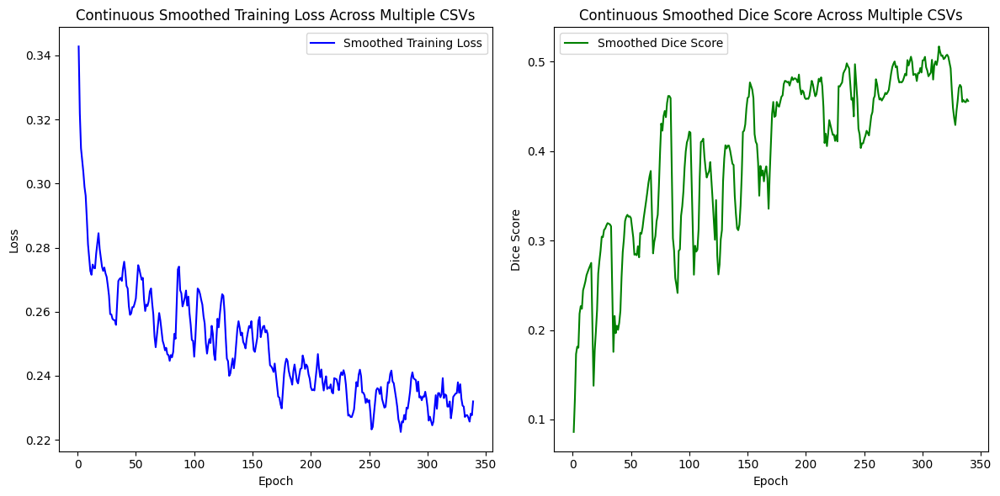

In [58]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def plot_continuous_metrics_multiple_files(csv_files, window_size=5):

    # Initializing lists to accumulate data across all files
    all_epochs = []
    all_smoothed_loss = []
    all_smoothed_dice = []

    # function to smooth the data using a moving average
    def smooth_data(data, window_size=5):
        return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

    for file_idx, csv_file in enumerate(csv_files):
        data = pd.read_csv(csv_file)
        folds = sorted(data['Fold'].unique())  # Sort the folds to ensure they are in order

        for fold in folds:
            fold_data = data[data['Fold'] == fold]
            epochs = fold_data['Epoch'].values
            avg_loss = fold_data['Average Loss'].values
            dice_score = fold_data['Mean Dice Score'].values

            # Apply smoothing
            smoothed_loss = smooth_data(avg_loss, window_size=window_size)
            smoothed_dice = smooth_data(dice_score, window_size=window_size)
            smoothed_epochs = epochs[:len(smoothed_loss)]  # Adjust epochs to match the smoothed data

            if all_epochs:
                smoothed_epochs += all_epochs[-1] + 1  
            all_epochs.extend(smoothed_epochs)
            all_smoothed_loss.extend(smoothed_loss)
            all_smoothed_dice.extend(smoothed_dice)

    # Plot the accumulated data
    plt.figure(figsize=(12, 6))

    # Plot Smoothed Training Loss
    plt.subplot(1, 2, 1)
    plt.plot(all_epochs, all_smoothed_loss, label='Smoothed Training Loss', color='blue')
    plt.title("Continuous Smoothed Training Loss Across Multiple CSVs")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()

    # Plot Smoothed Dice Score
    plt.subplot(1, 2, 2)
    plt.plot(all_epochs, all_smoothed_dice, label='Smoothed Dice Score', color='green')
    plt.title("Continuous Smoothed Dice Score Across Multiple CSVs")
    plt.xlabel("Epoch")
    plt.ylabel("Dice Score")
    plt.legend()

    # Final layout adjustments and show the combined plot
    plt.tight_layout()
    plt.show()

csv_files = [
    '/kaggle/working/fold_metrics_trial1.csv',
    '/kaggle/working/fold_metrics_trial2.csv',
    '/kaggle/working/fold_metrics_trial3.csv',
    '/kaggle/working/fold_metrics_trial4.csv'
]
plot_continuous_metrics_multiple_files(csv_files, window_size=5)

**PLOTS OF DIFFERENT TRIALS AND FOLDS**

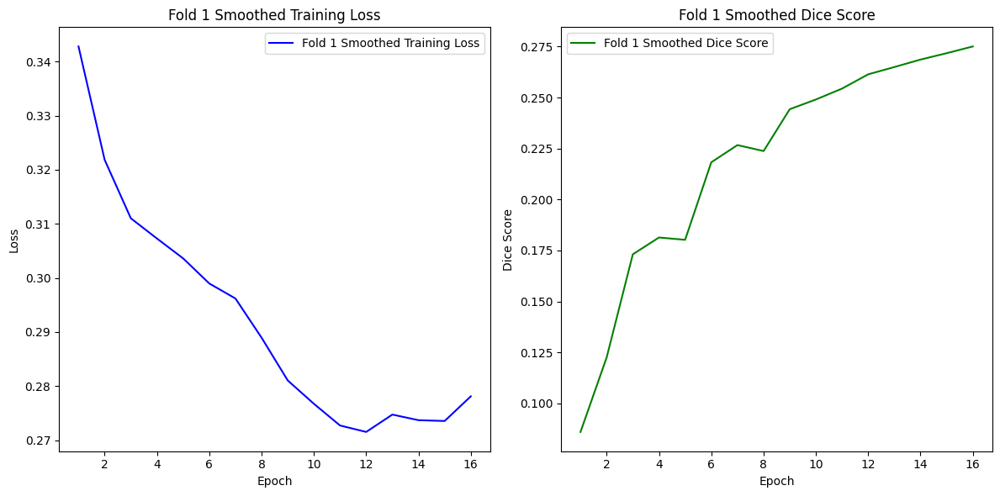

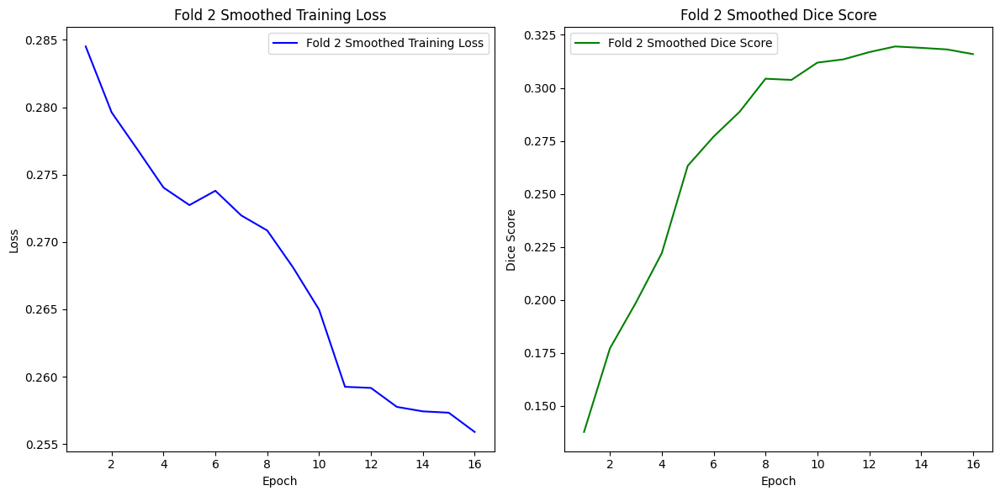

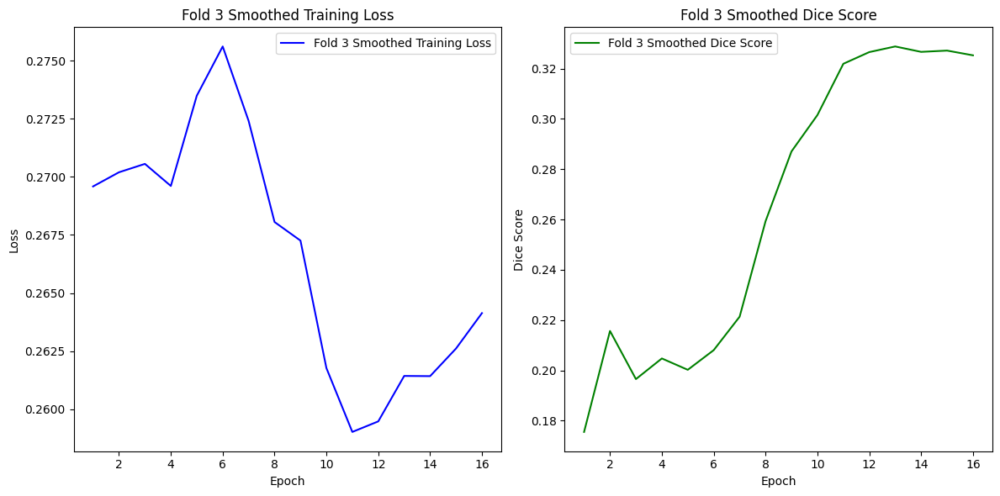

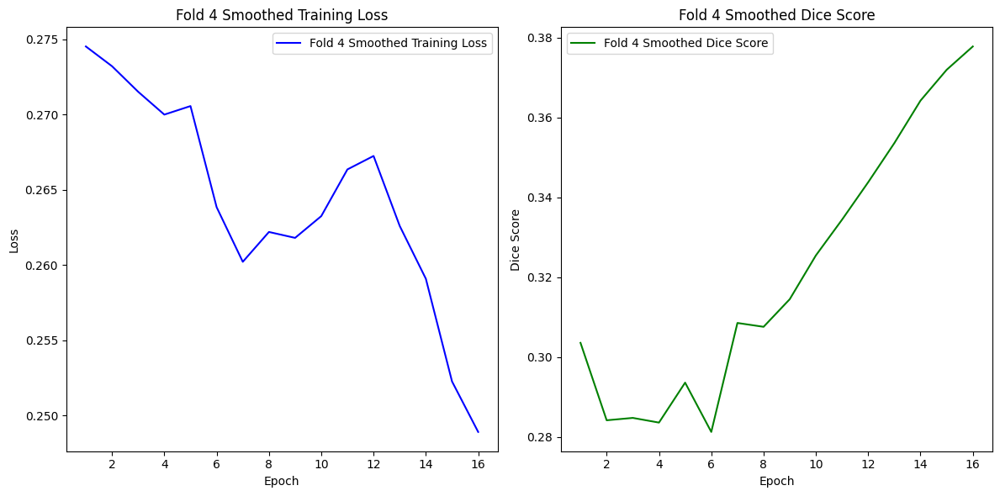

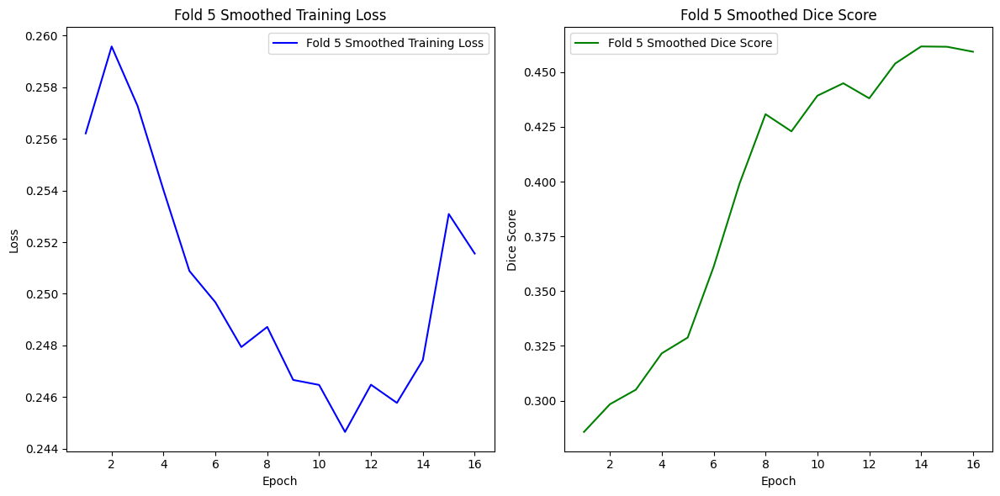

...

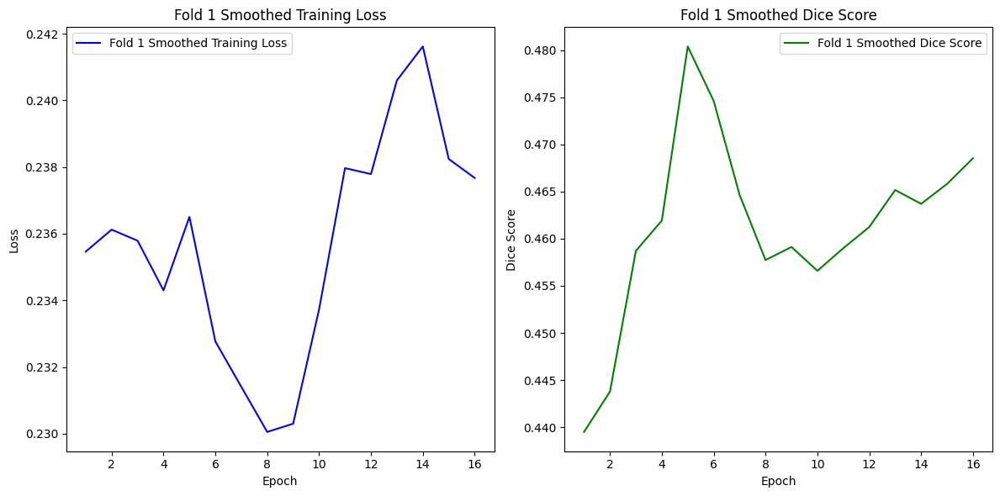

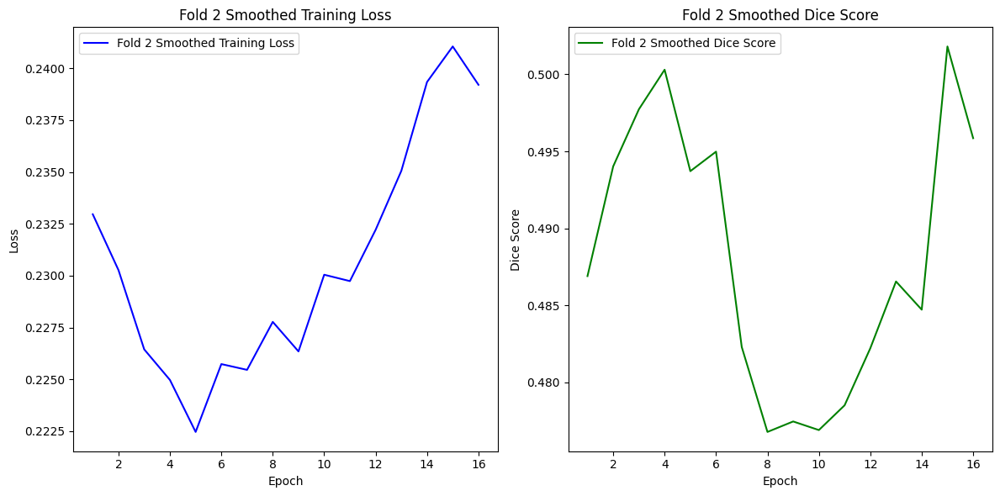

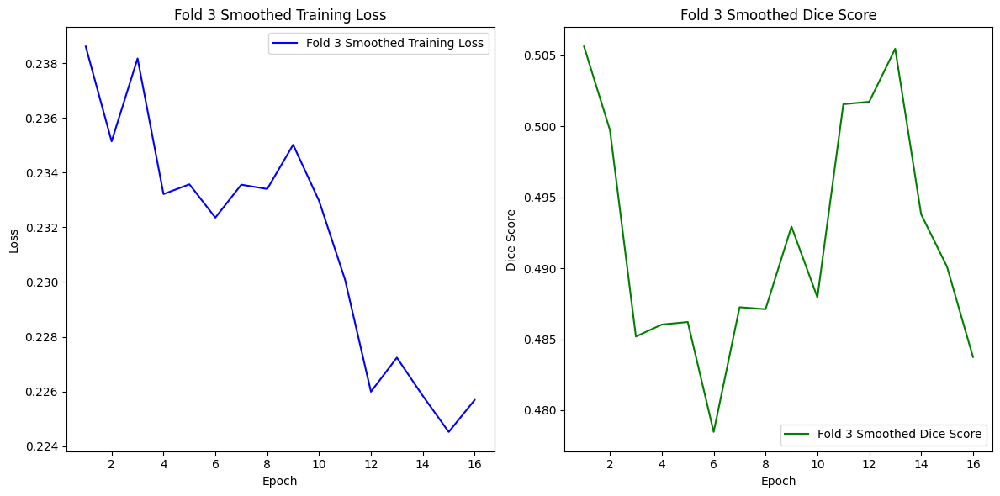

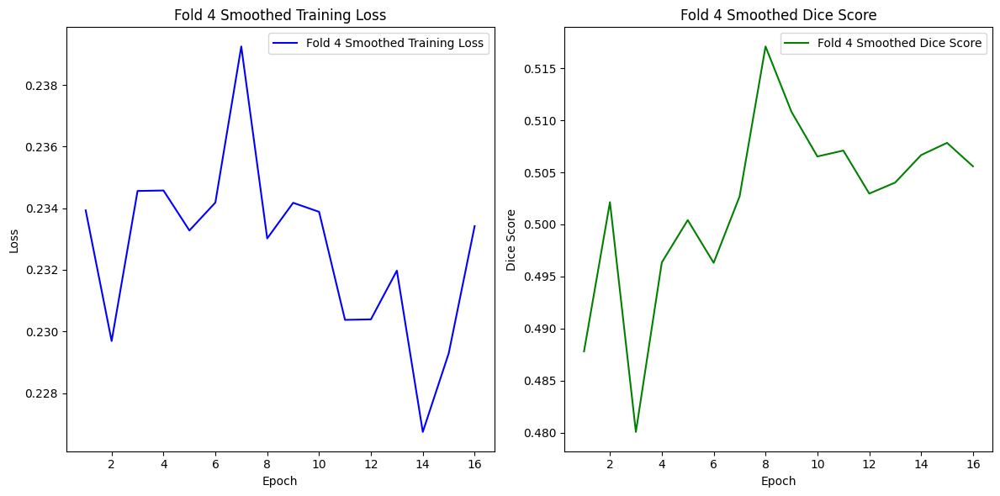

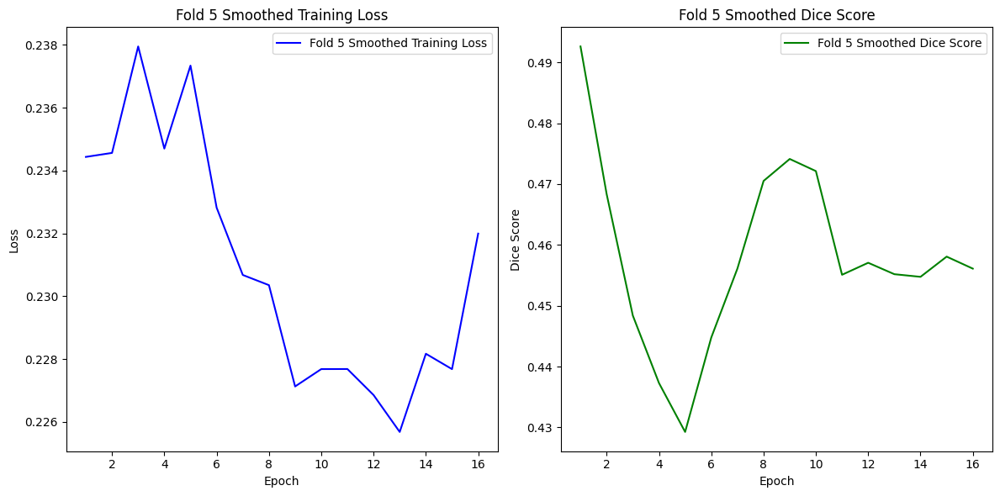

In [59]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

def plot_fold_metrics(csv_file, window_size=5):

    data = pd.read_csv(csv_file)
    folds = data['Fold'].unique()

    # function to smooth the data using a moving average
    def smooth_data(data, window_size=5):
        return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

    # Plotting the results for each fold
    for fold in folds:
        fold_data = data[data['Fold'] == fold]
        epochs = fold_data['Epoch'].values
        avg_loss = fold_data['Average Loss'].values
        dice_score = fold_data['Mean Dice Score'].values

        # Apply smoothing
        smoothed_loss = smooth_data(avg_loss, window_size=window_size)
        smoothed_dice = smooth_data(dice_score, window_size=window_size)
        smoothed_epochs = epochs[:len(smoothed_loss)]  # Adjust epochs to match the smoothed data

        plt.figure(figsize=(12, 6))

        # Plot Smoothed Training Loss
        plt.subplot(1, 2, 1)
        plt.plot(smoothed_epochs, smoothed_loss, label=f'Fold {fold} Smoothed Training Loss', color='blue')
        plt.title(f"Fold {fold} Smoothed Training Loss")
        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.legend()

        # Plot Smoothed Dice Score
        plt.subplot(1, 2, 2)
        plt.plot(smoothed_epochs, smoothed_dice, label=f'Fold {fold} Smoothed Dice Score', color='green')
        plt.title(f"Fold {fold} Smoothed Dice Score")
        plt.xlabel("Epoch")
        plt.ylabel("Dice Score")
        plt.legend()

        plt.tight_layout()
        plt.show()

plot_fold_metrics('/kaggle/working/fold_metrics_trial1.csv', window_size=5)
plot_fold_metrics('/kaggle/working/fold_metrics_trial2.csv', window_size=5)
plot_fold_metrics('/kaggle/working/fold_metrics_trial3.csv', window_size=5)
plot_fold_metrics('/kaggle/working/fold_metrics_trial4.csv', window_size=5)

## Check best model(trial 3- fold 5) output with the input image and label

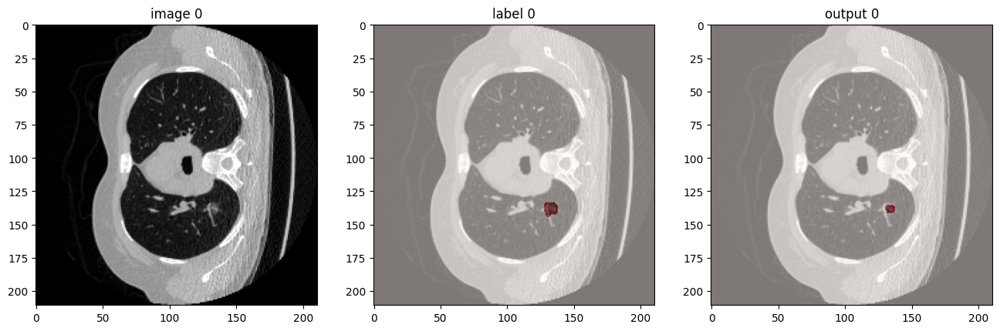

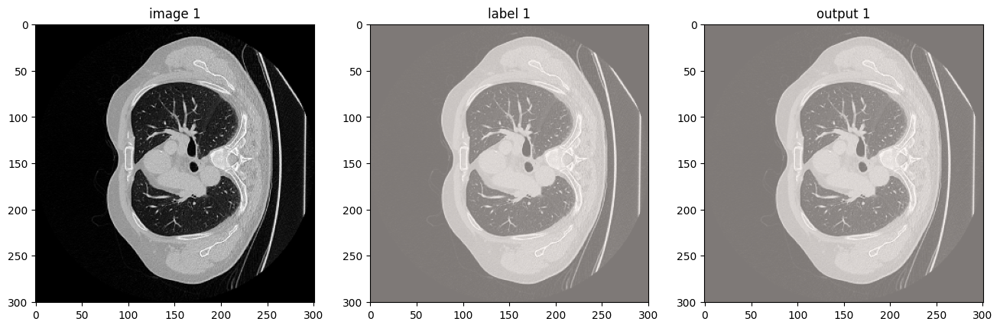

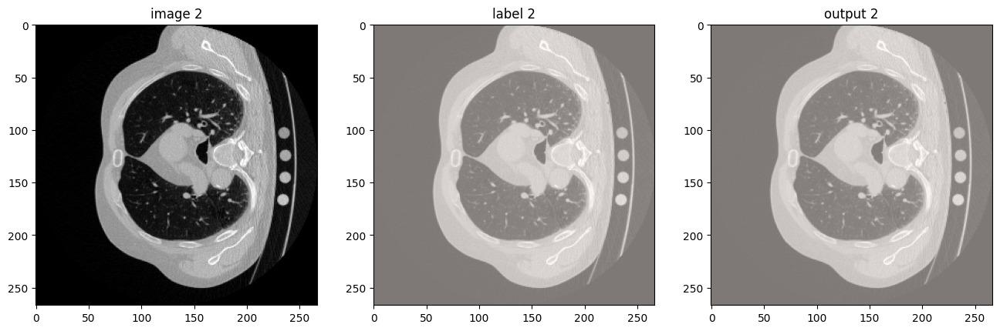

In [40]:
import matplotlib.pyplot as plt
import torch
import numpy as np

model.load_state_dict(torch.load("/kaggle/working/best_metric_model_trial3_fold5.pth"))
model.eval()
device = "cuda"

with torch.no_grad():
    for i, val_data in enumerate(val_loader):
        roi_size = (160, 160, 160)
        sw_batch_size = 4
        val_outputs = sliding_window_inference(val_data["image"].to(device), roi_size, sw_batch_size, model)
        
        # Extracting the specific slice to plot
        image_slice = val_data["image"][0, 0, :, :, 100].cpu().numpy()
        label_slice = val_data["label"][0, 0, :, :, 100].cpu().numpy()
        output_slice = torch.argmax(val_outputs, dim=1).detach().cpu()[0, :, :, 100].numpy()
        
        # Plot the image with the label overlay
        plt.figure("check", (16, 16))
        plt.subplot(1, 3, 1)
        plt.title(f"image {i}")
        plt.imshow(image_slice, cmap="gray")
        
        plt.subplot(1, 3, 2)
        plt.title(f"label {i}")
        plt.imshow(image_slice, cmap="gray")
        plt.imshow(label_slice, cmap="Reds", alpha=0.5)  # Red transparent overlay
        
        plt.subplot(1, 3, 3)
        plt.title(f"output {i}")
        plt.imshow(image_slice, cmap="gray")
        plt.imshow(output_slice, cmap="Reds", alpha=0.5)
        
        
        plt.show()
        
        if i == 2:
            break

## Evaluation on original image spacings

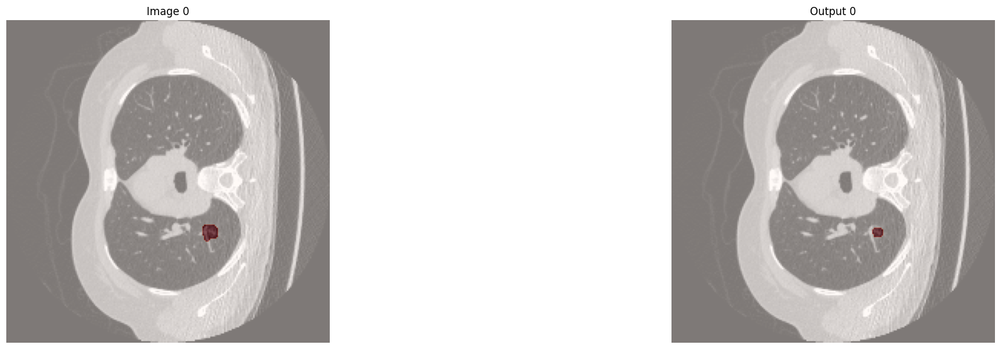

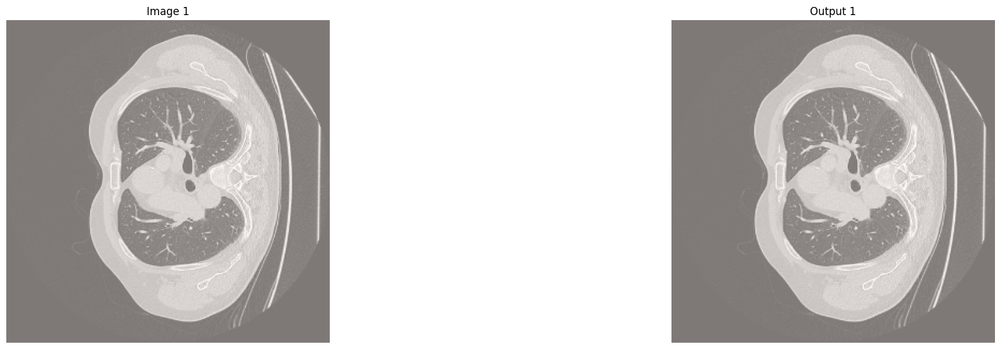

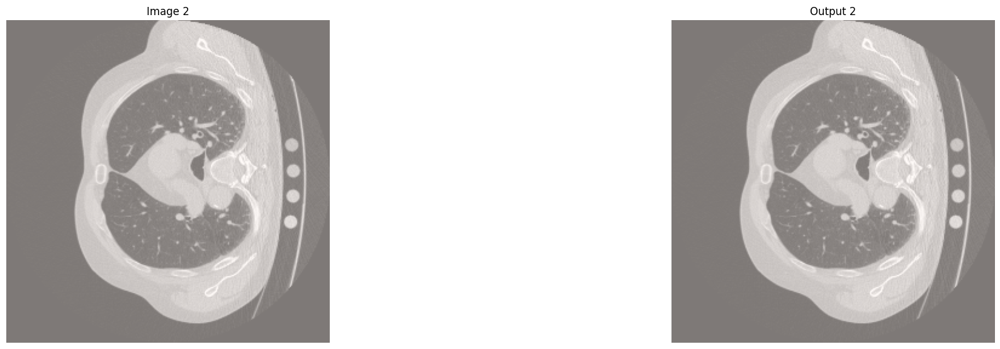

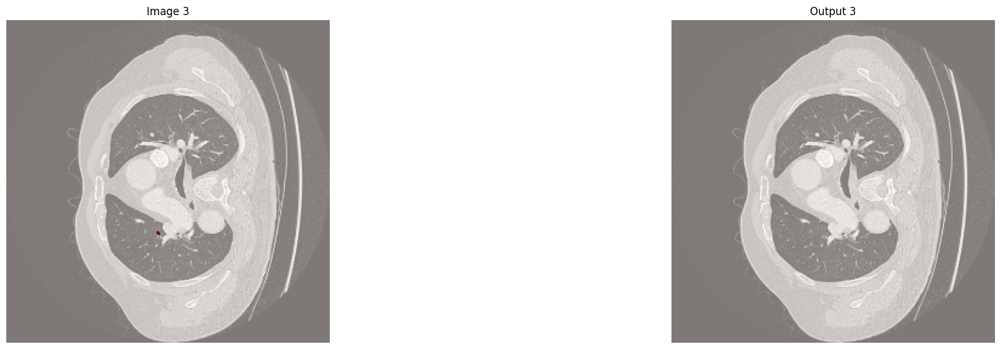

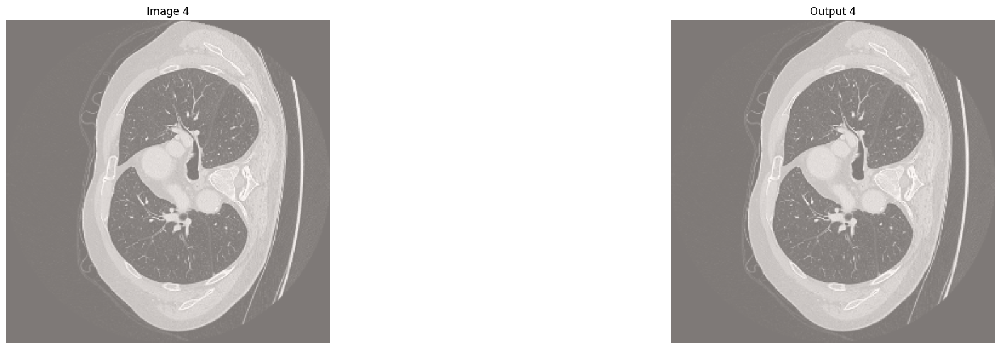

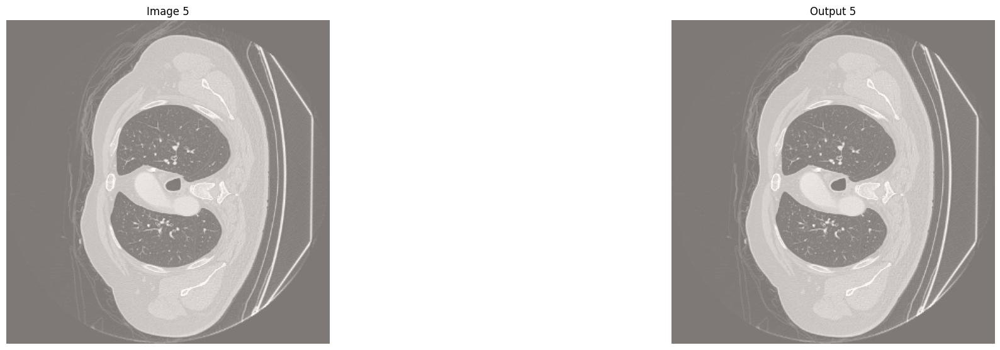

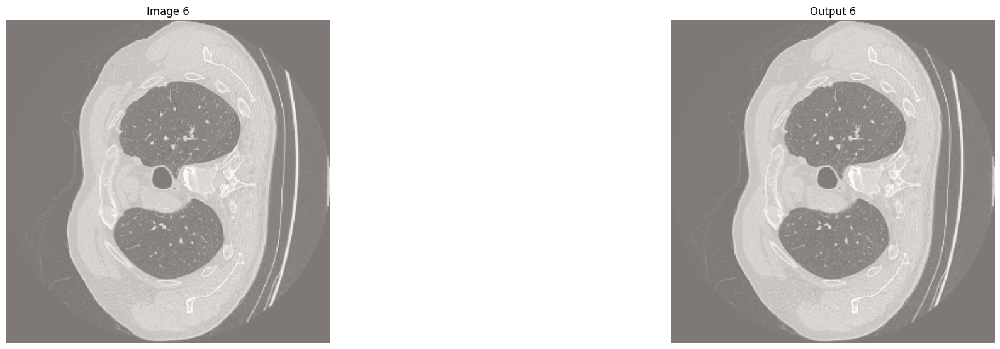

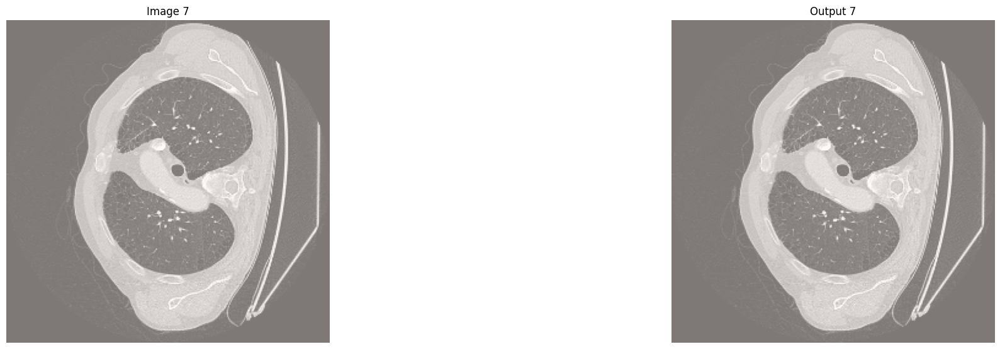

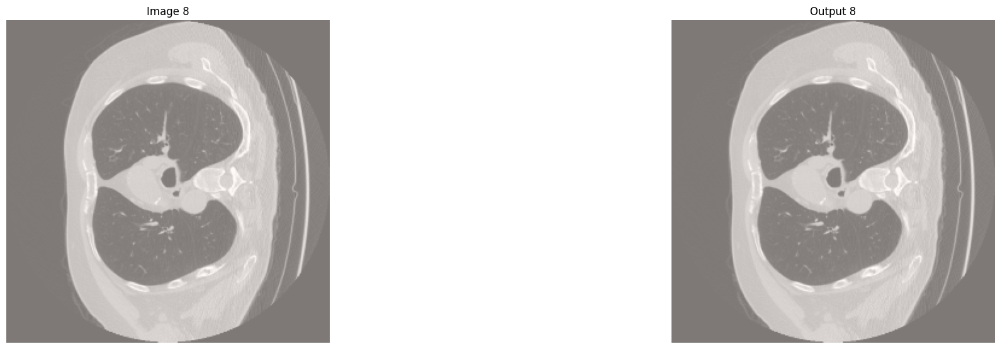

In [41]:
import matplotlib.pyplot as plt
import torch
from monai.inferers import sliding_window_inference
from monai.transforms import Compose, AsDiscrete
from monai.data import decollate_batch, DataLoader
from monai.metrics import DiceMetric

model.load_state_dict(torch.load("/kaggle/working/best_metric_model_trial3_fold5.pth"))
model.eval()

# Configuration
device = "cuda"
roi_size = (160, 160, 160)
sw_batch_size = 4
slice_idx = 100  

# Function to plot images with red transparent overlay for the label
def plot_images(img, label, pred, index):
    plt.figure(figsize=(16, 16))

    plt.subplot(1, 3, 1)
    plt.title(f"Image {index}")
    plt.imshow(img, cmap="gray")
    plt.imshow(label, cmap="Reds", alpha=0.5)  
    plt.axis('off')


    # Prediction
    plt.subplot(1, 3, 3)
    plt.title(f"Output {index}")
    plt.imshow(img, cmap="gray")
    plt.imshow(pred, cmap="Reds", alpha=0.5)
    plt.axis('off')

    plt.tight_layout()
    plt.show()

with torch.no_grad():
    for i, val_data in enumerate(val_loader):
        val_inputs = val_data["image"].to(device)
        val_labels = val_data["label"].to(device)

        # Perform inference
        val_outputs = sliding_window_inference(val_inputs, roi_size, sw_batch_size, model)

        # Get predictions
        pred = torch.argmax(val_outputs, dim=1).detach().cpu()
        img = val_inputs[0, 0, :, :, slice_idx].cpu()
        label = val_labels[0, 0, :, :, slice_idx].cpu()
        pred = pred[0, :, :, slice_idx]

        # Plot the images
        plot_images(img, label, pred, i)

        if i == 10: 
            break

In [63]:
val_org_transforms = Compose(
    [
        LoadImaged(keys=["image", "label"]),
        EnsureChannelFirstd(keys=["image", "label"]),
        Orientationd(keys=["image"], axcodes="RAS"),
        Spacingd(keys=["image"], pixdim=(1.5, 1.5, 2.0), mode="bilinear"),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=-1000,
            a_max=500,
            b_min=0.0,
            b_max=1.0,
            clip=True,
        ),
        CropForegroundd(keys=["image"], source_key="image"),
    ]
)

val_org_ds = Dataset(data=val_files, transform=val_org_transforms)
val_org_loader = DataLoader(val_org_ds, batch_size=1, num_workers=1)

post_transforms = Compose(
    [
        Invertd(
            keys="pred",
            transform=val_org_transforms,
            orig_keys="image",
            meta_keys="pred_meta_dict",
            orig_meta_keys="image_meta_dict",
            meta_key_postfix="meta_dict",
            nearest_interp=False,
            to_tensor=True,
            device="cpu",
        ),
        AsDiscreted(keys="pred", argmax=True, to_onehot=2),
        AsDiscreted(keys="label", to_onehot=2),
    ]
)

/opt/conda/lib/python3.10/site-packages/monai/utils/deprecate_utils.py:321: FutureWarning: monai.transforms.croppad.dictionary CropForegroundd.__init__:allow_smaller: Current default value of argument `allow_smaller=True` has been deprecated since version 1.2. It will be changed to `allow_smaller=False` in version 1.5.
  warn_deprecated(argname, msg, warning_category)


In [64]:
model.load_state_dict(torch.load("/kaggle/working/best_metric_model_trial3_fold5.pth"))
model.eval()
dice_metric = DiceMetric(include_background=True, reduction="mean")

with torch.no_grad():
    for val_data in val_org_loader:
        val_inputs = val_data["image"].to(device)
        roi_size = (128, 128, 128)
        sw_batch_size = 1
        val_data["pred"] = sliding_window_inference(val_inputs, roi_size, sw_batch_size, model)
        val_data = [post_transforms(i) for i in decollate_batch(val_data)]
        val_outputs, val_labels = from_engine(["pred", "label"])(val_data)
        # compute metric for current iteration
        dice_metric(y_pred=val_outputs, y=val_labels)

    # aggregate the final mean dice result
    metric_org = dice_metric.aggregate().item()
    # reset the status for next validation round
    dice_metric.reset()

print("Metric on original image spacing: ", metric_org)

Metric on original image spacing:  0.7657967805862427


## Inference on Test Set

In [70]:
test_images = sorted(glob.glob(os.path.join(data_dir, "imagesTs", "*.nii")))

test_data = [{"image": image} for image in test_images]


test_org_transforms = Compose(
    [
        LoadImaged(keys="image"),
        EnsureChannelFirstd(keys="image"),
        Orientationd(keys=["image"], axcodes="LPS"),
        Spacingd(keys=["image"], pixdim=(1.5, 1.5, 2.0), mode="bilinear"),
        ScaleIntensityRanged(
            keys=["image"],
            a_min=-1000,
            a_max=500,
            b_min=0.0,
            b_max=1.0,
            clip=True,
        ),
        CropForegroundd(keys=["image"], source_key="image"),
    ]
)

test_org_ds = Dataset(data=test_data, transform=test_org_transforms)

test_org_loader = DataLoader(test_org_ds, batch_size=1, num_workers=1)

post_transforms = Compose(
    [
        Invertd(
            keys="pred",
            transform=test_org_transforms,
            orig_keys="image",
            meta_keys="pred_meta_dict",
            orig_meta_keys="image_meta_dict",
            meta_key_postfix="meta_dict",
            nearest_interp=False,
            to_tensor=True,
        ),
        AsDiscreted(keys="pred", argmax=True, to_onehot=2),
        SaveImaged(keys="pred", meta_keys="pred_meta_dict", output_dir="./out", output_postfix="seg", resample=False),
    ]
)

In [71]:
# visualize the predicted results
from monai.transforms import LoadImage
loader = LoadImage()

2024-08-28 21:41:52,212 INFO image_writer.py:197 - writing: out/lung_002/lung_002_seg.nii.gz


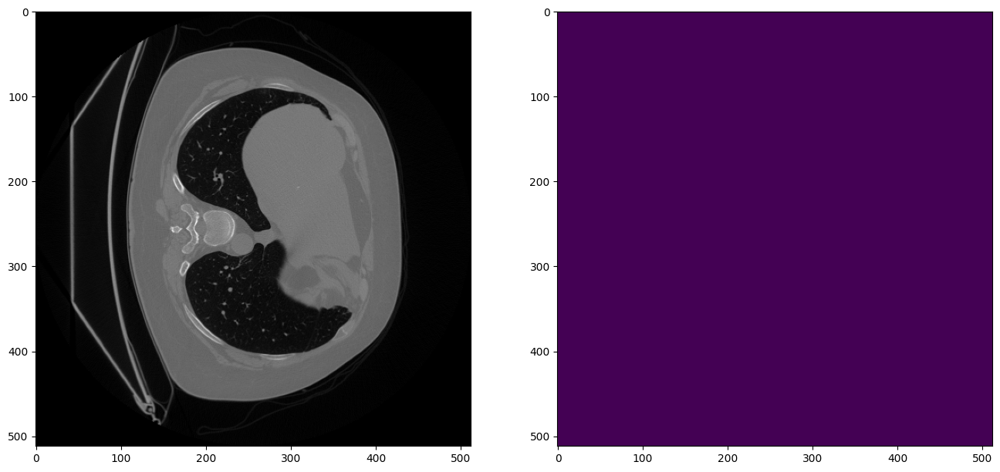

2024-08-28 21:42:02,115 INFO image_writer.py:197 - writing: out/lung_007/lung_007_seg.nii.gz


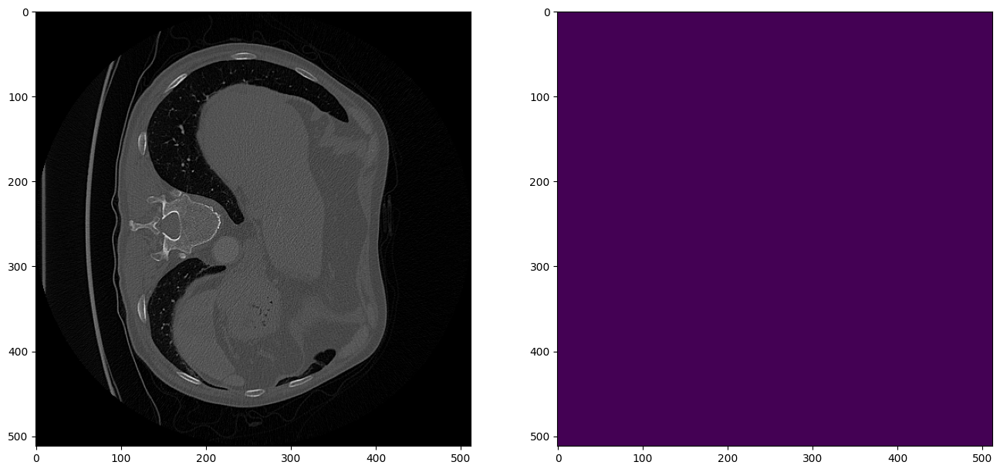

2024-08-28 21:42:12,274 INFO image_writer.py:197 - writing: out/lung_008/lung_008_seg.nii.gz


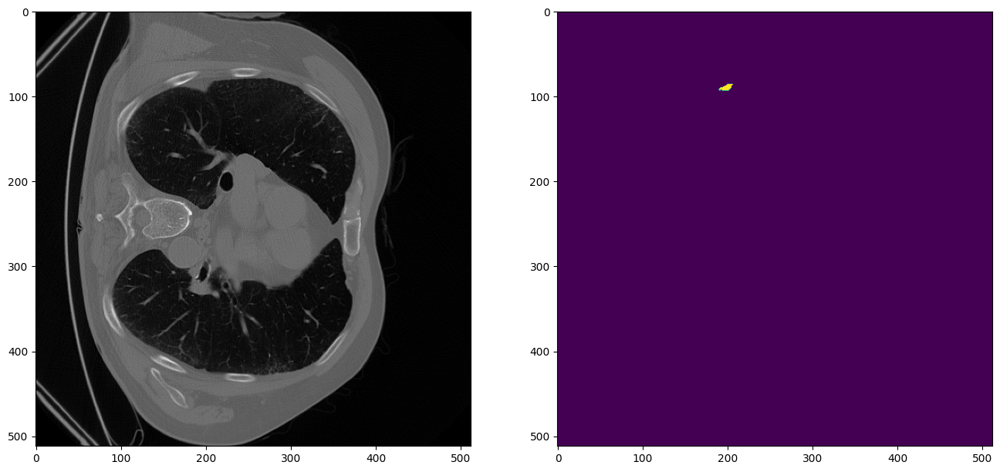

2024-08-28 21:42:20,444 INFO image_writer.py:197 - writing: out/lung_011/lung_011_seg.nii.gz


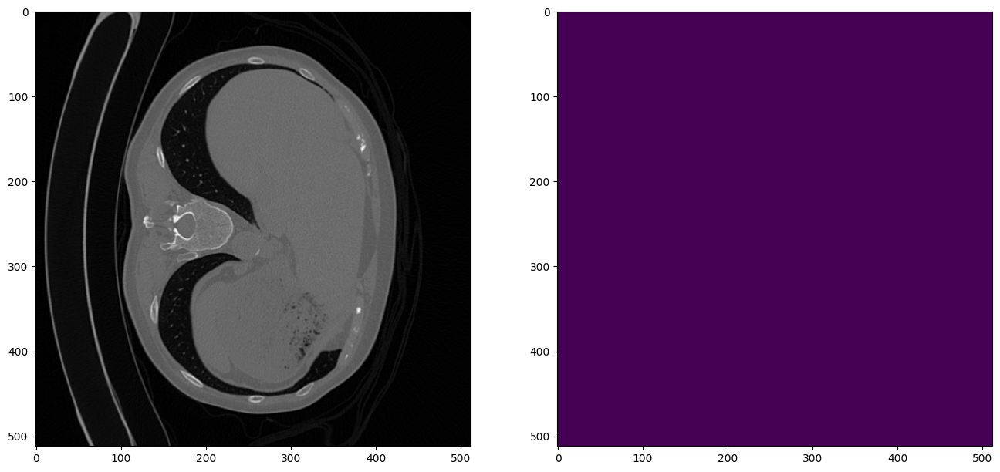

2024-08-28 21:42:32,313 INFO image_writer.py:197 - writing: out/lung_012/lung_012_seg.nii.gz


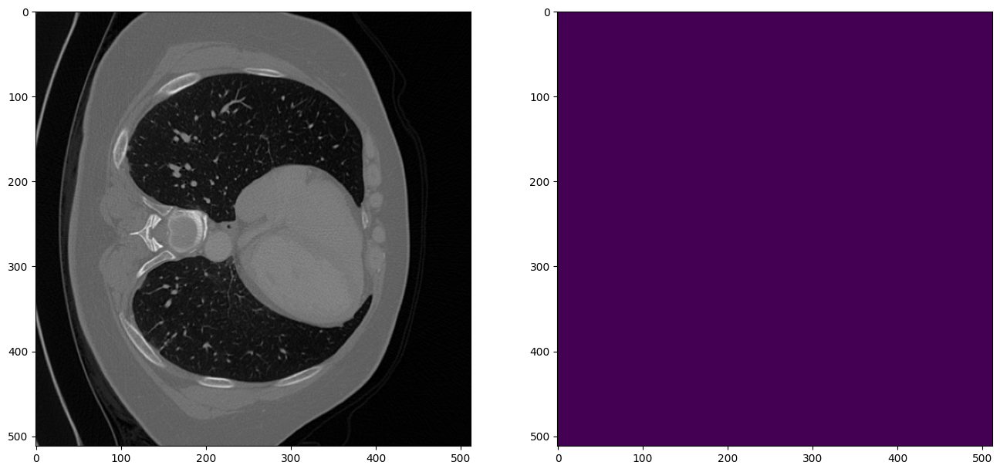

2024-08-28 21:42:45,953 INFO image_writer.py:197 - writing: out/lung_013/lung_013_seg.nii.gz


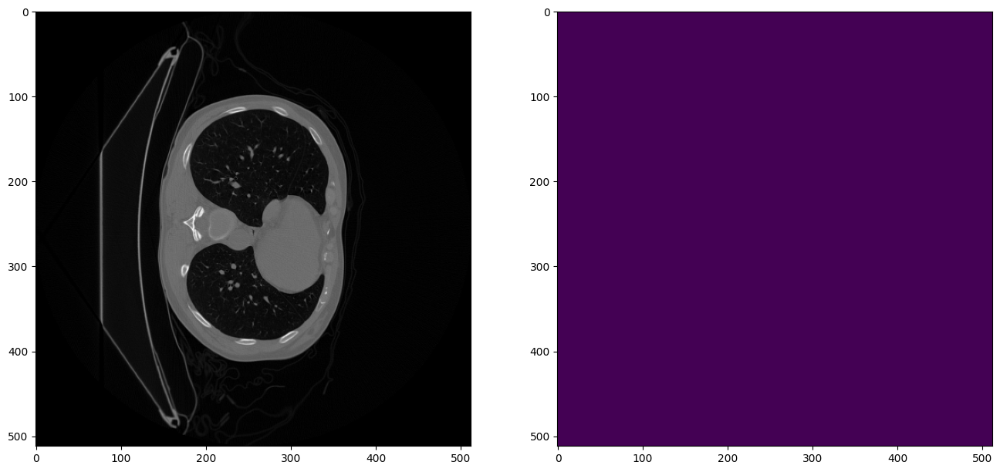

2024-08-28 21:42:58,212 INFO image_writer.py:197 - writing: out/lung_017/lung_017_seg.nii.gz


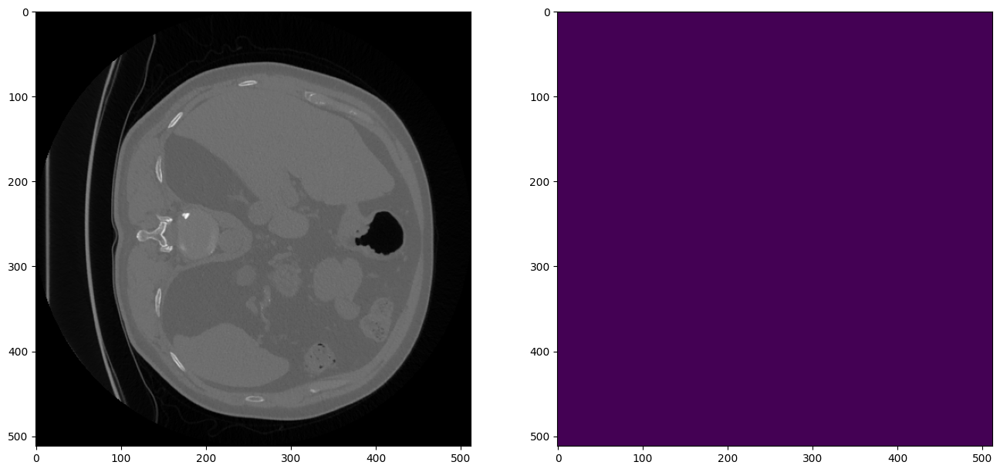

2024-08-28 21:43:16,746 INFO image_writer.py:197 - writing: out/lung_019/lung_019_seg.nii.gz


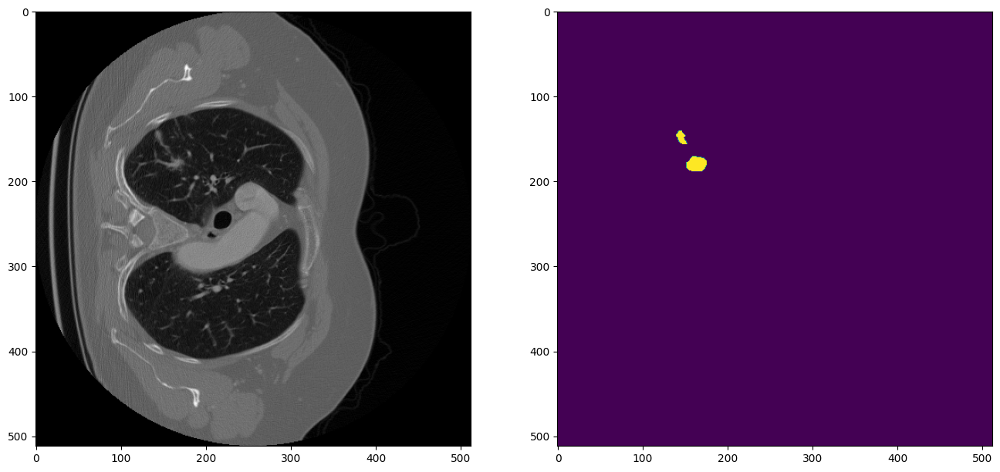

2024-08-28 21:43:24,020 INFO image_writer.py:197 - writing: out/lung_021/lung_021_seg.nii.gz


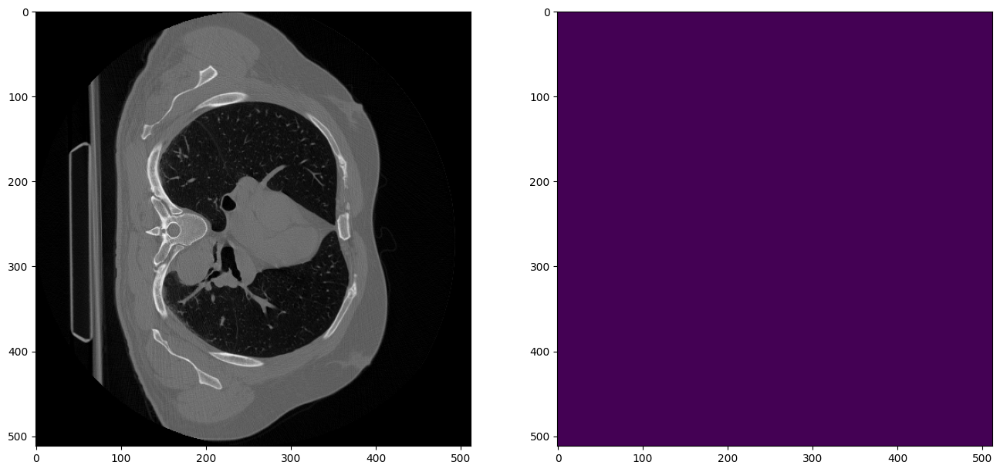

2024-08-28 21:43:33,371 INFO image_writer.py:197 - writing: out/lung_024/lung_024_seg.nii.gz


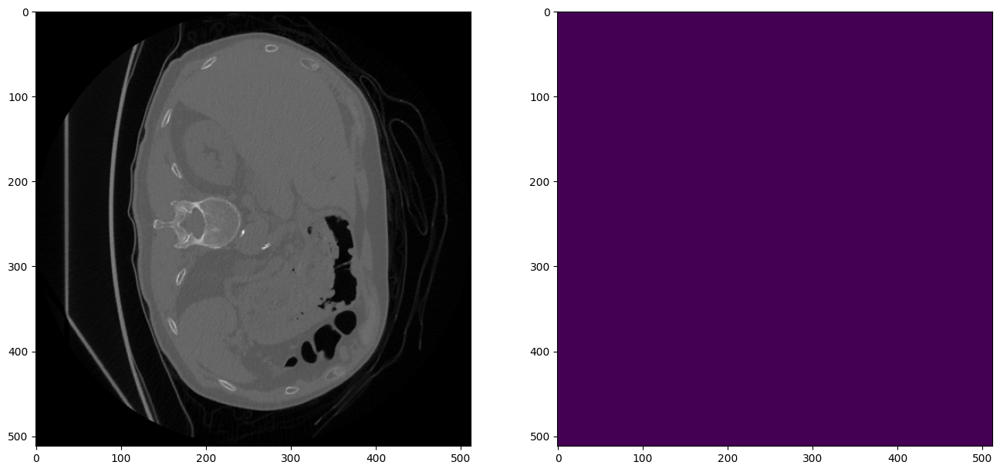

2024-08-28 21:43:49,787 INFO image_writer.py:197 - writing: out/lung_030/lung_030_seg.nii.gz


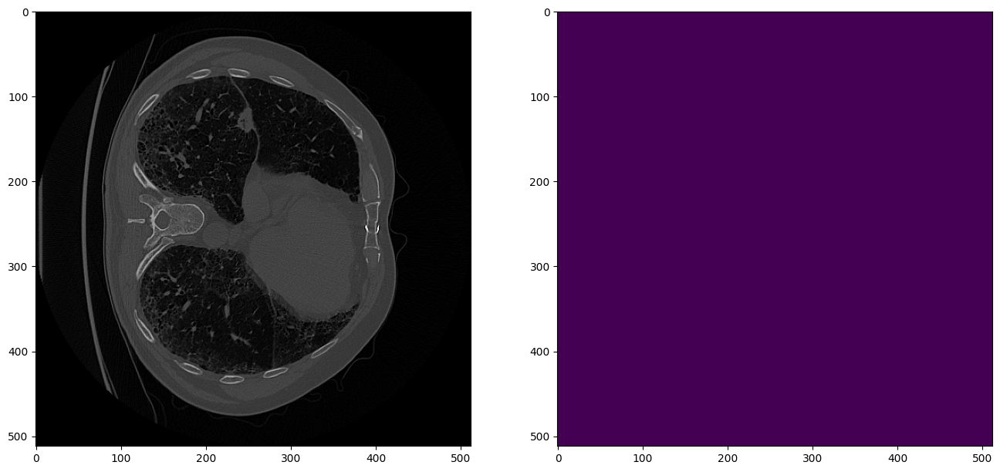

2024-08-28 21:44:02,627 INFO image_writer.py:197 - writing: out/lung_032/lung_032_seg.nii.gz


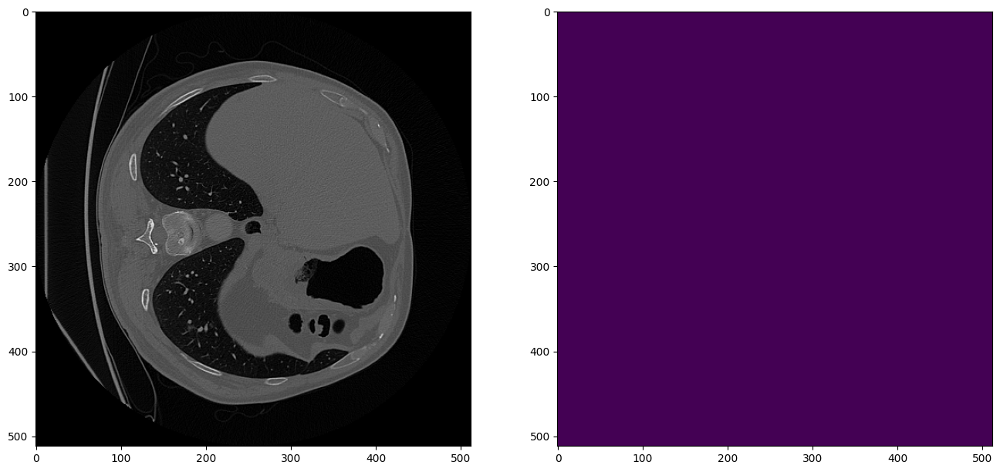

2024-08-28 21:44:14,881 INFO image_writer.py:197 - writing: out/lung_035/lung_035_seg.nii.gz


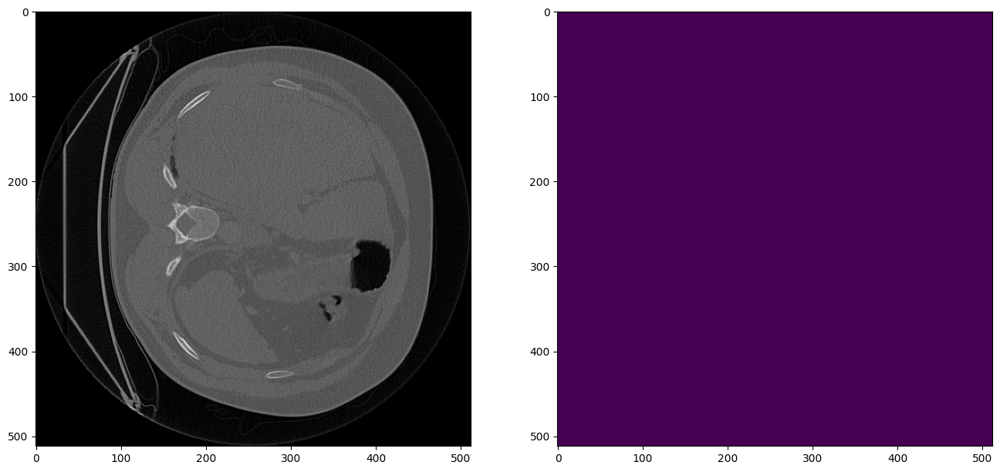

2024-08-28 21:44:28,053 INFO image_writer.py:197 - writing: out/lung_039/lung_039_seg.nii.gz


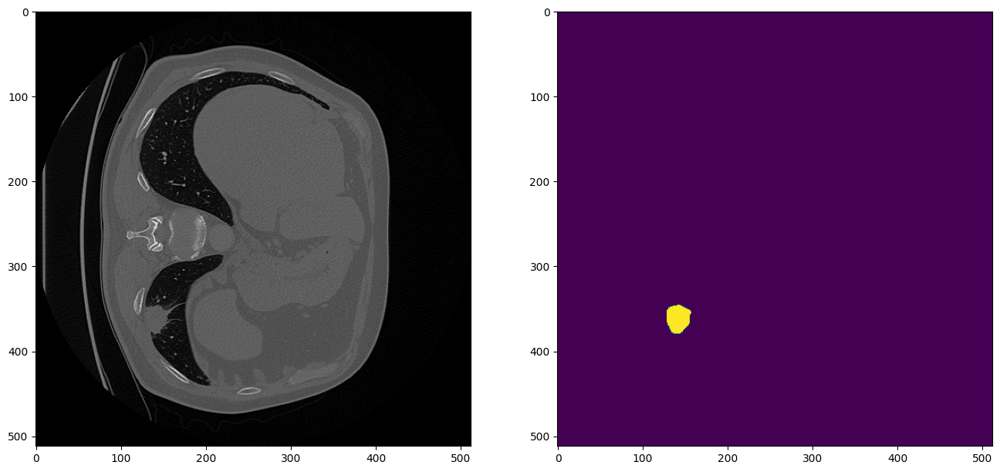

2024-08-28 21:44:41,132 INFO image_writer.py:197 - writing: out/lung_040/lung_040_seg.nii.gz


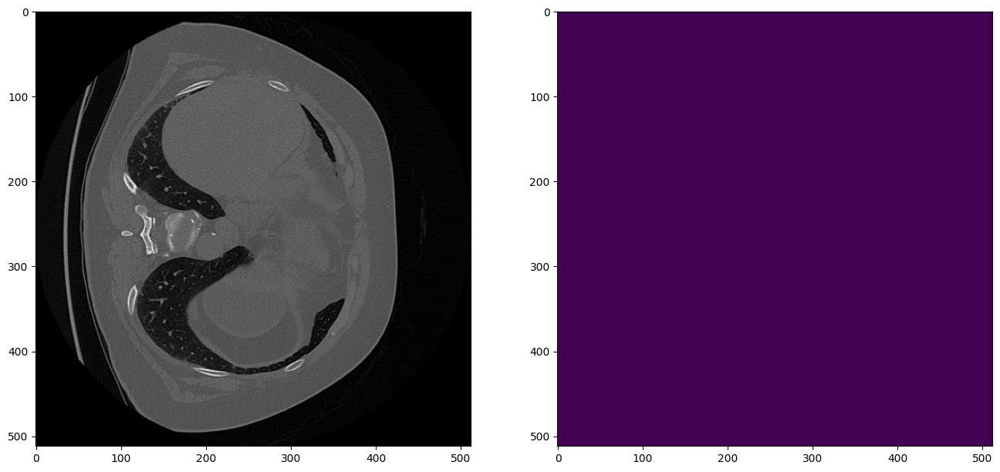

2024-08-28 21:44:51,240 INFO image_writer.py:197 - writing: out/lung_050/lung_050_seg.nii.gz


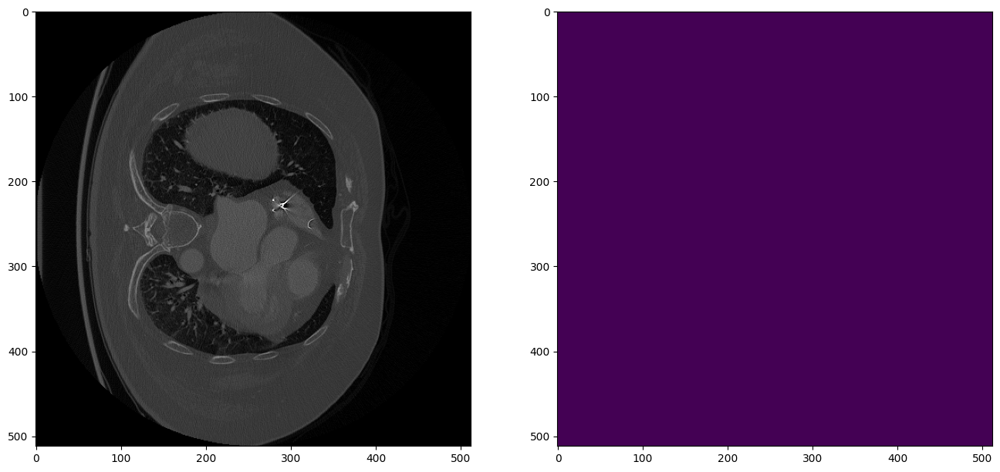

2024-08-28 21:44:59,768 INFO image_writer.py:197 - writing: out/lung_052/lung_052_seg.nii.gz


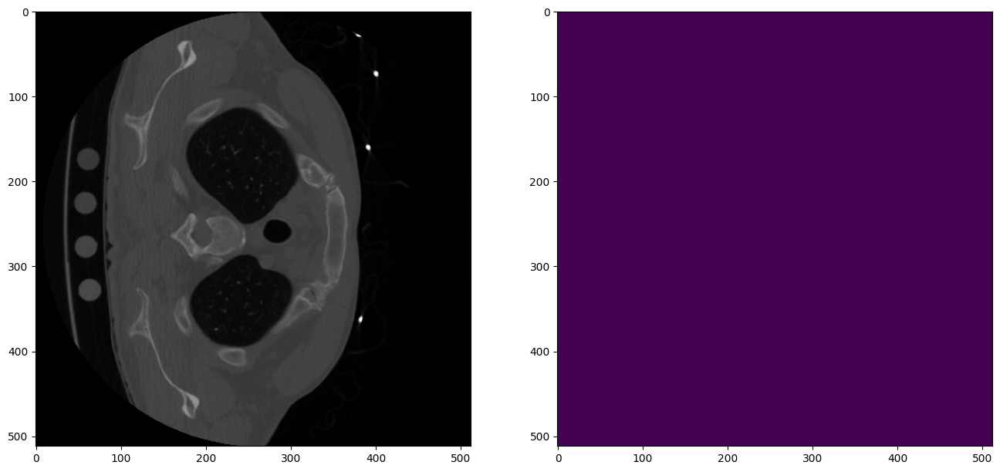

2024-08-28 21:45:04,746 INFO image_writer.py:197 - writing: out/lung_056/lung_056_seg.nii.gz


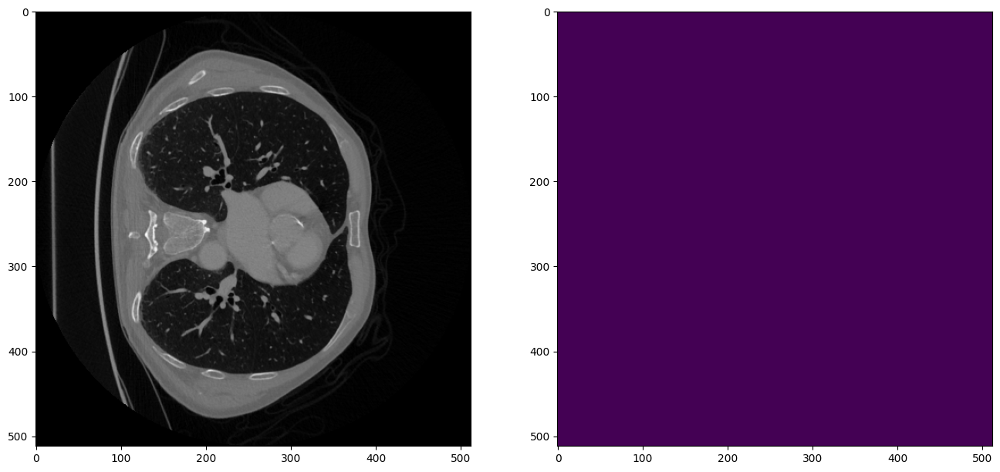

2024-08-28 21:45:13,305 INFO image_writer.py:197 - writing: out/lung_060/lung_060_seg.nii.gz


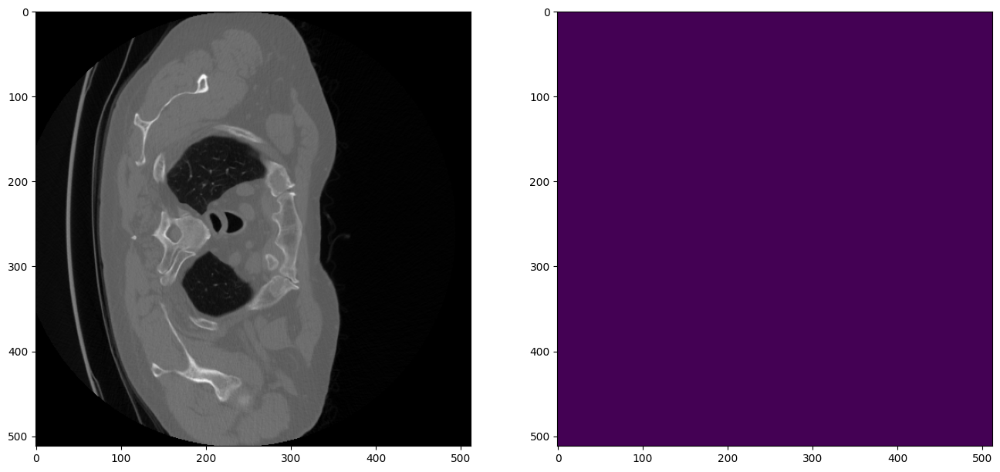

2024-08-28 21:45:18,958 INFO image_writer.py:197 - writing: out/lung_063/lung_063_seg.nii.gz


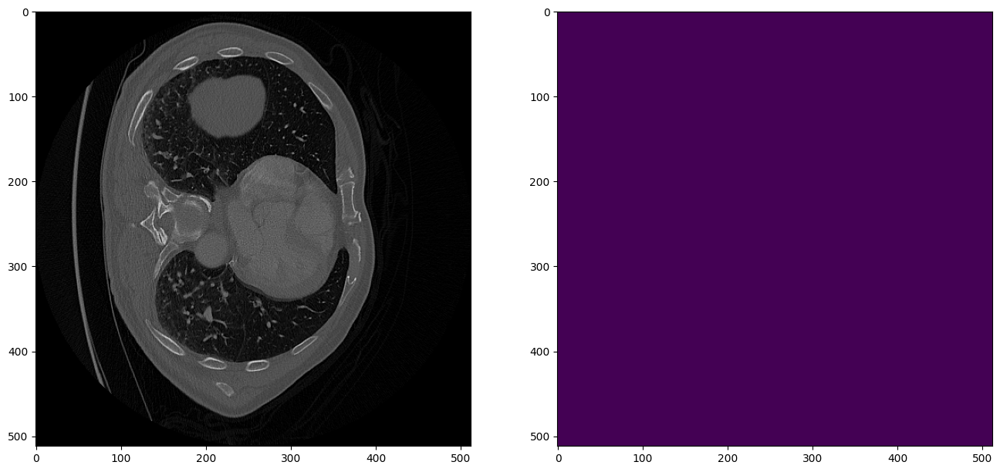

2024-08-28 21:45:27,995 INFO image_writer.py:197 - writing: out/lung_067/lung_067_seg.nii.gz


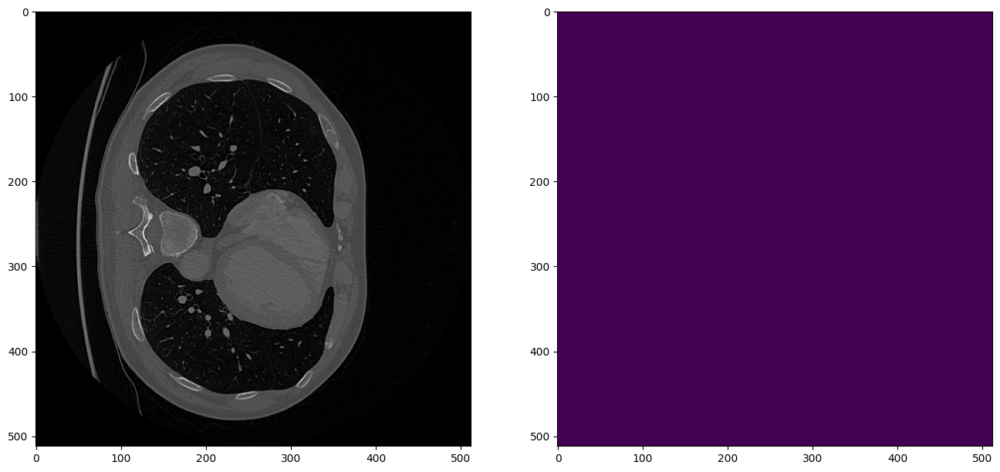

2024-08-28 21:45:41,137 INFO image_writer.py:197 - writing: out/lung_068/lung_068_seg.nii.gz


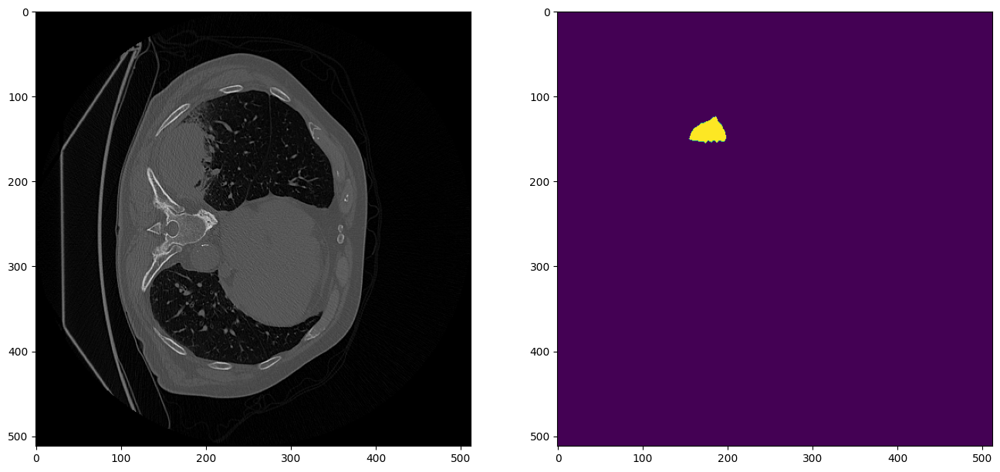

2024-08-28 21:45:50,253 INFO image_writer.py:197 - writing: out/lung_072/lung_072_seg.nii.gz


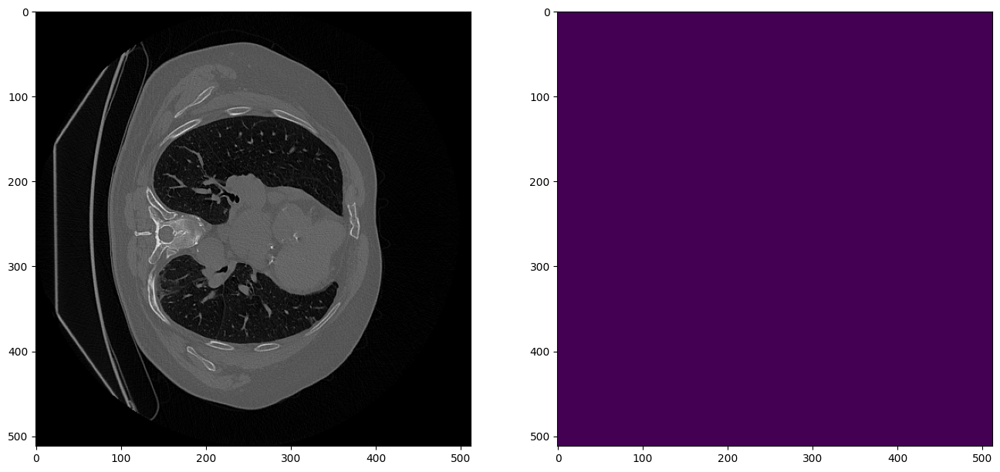

2024-08-28 21:45:57,965 INFO image_writer.py:197 - writing: out/lung_076/lung_076_seg.nii.gz


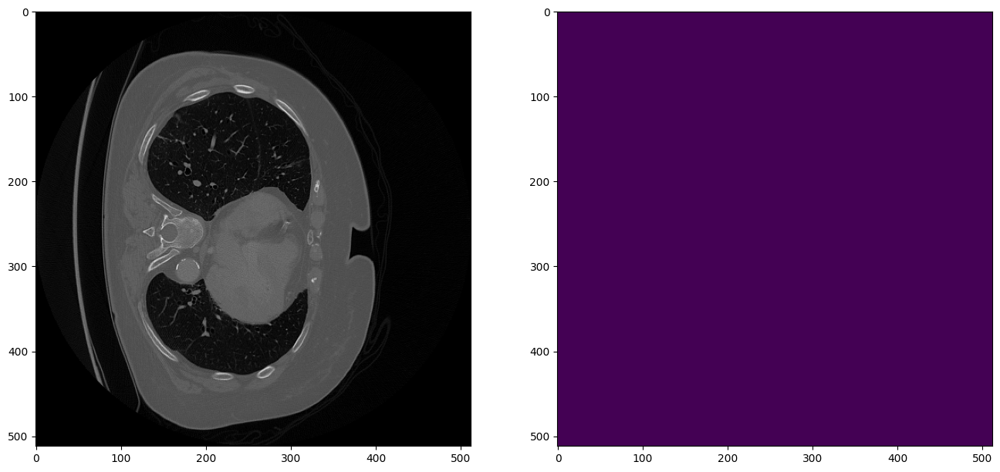

2024-08-28 21:46:07,664 INFO image_writer.py:197 - writing: out/lung_077/lung_077_seg.nii.gz


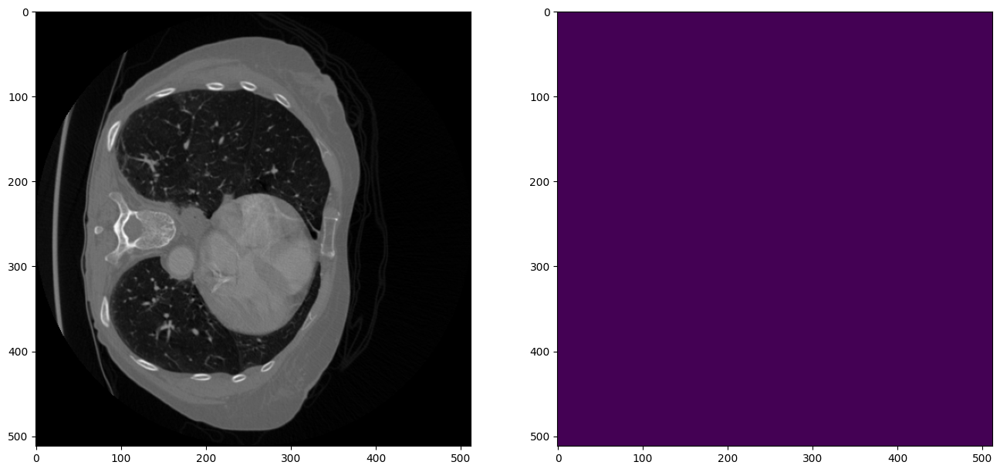

2024-08-28 21:46:17,623 INFO image_writer.py:197 - writing: out/lung_082/lung_082_seg.nii.gz


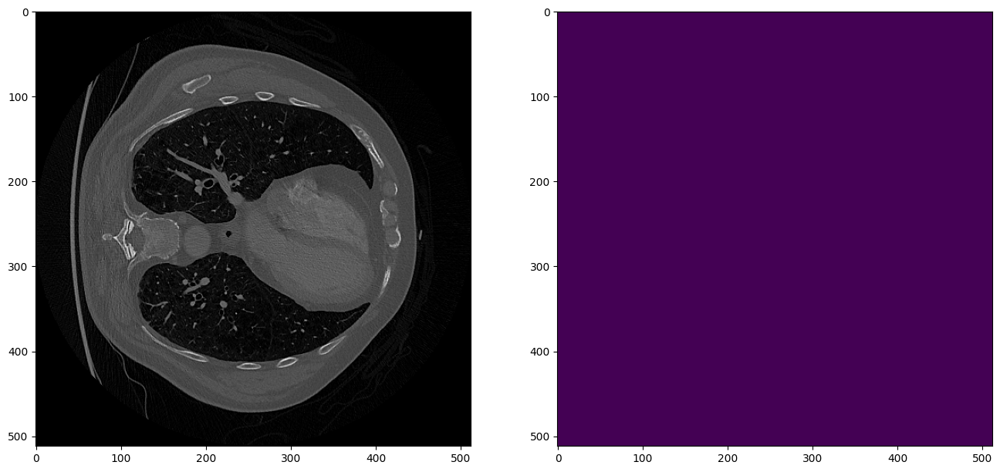

2024-08-28 21:46:27,479 INFO image_writer.py:197 - writing: out/lung_085/lung_085_seg.nii.gz


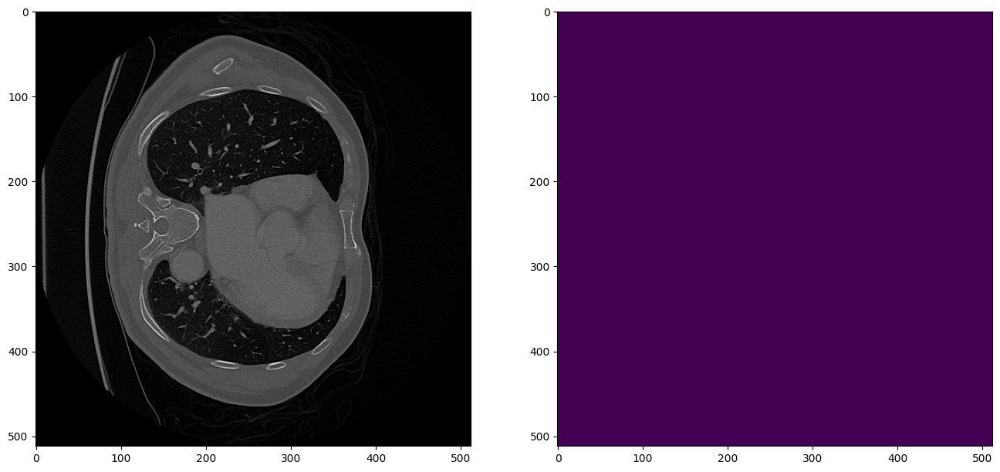

2024-08-28 21:46:37,102 INFO image_writer.py:197 - writing: out/lung_087/lung_087_seg.nii.gz


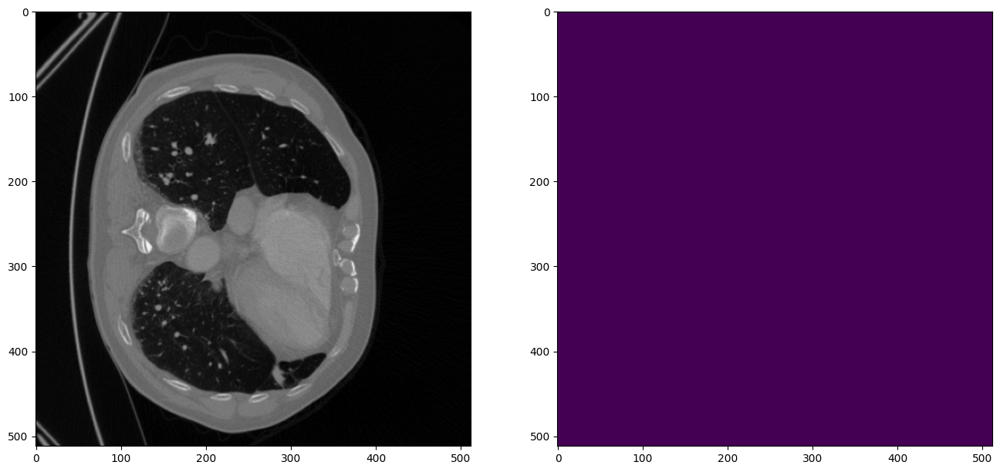

2024-08-28 21:46:50,447 INFO image_writer.py:197 - writing: out/lung_088/lung_088_seg.nii.gz


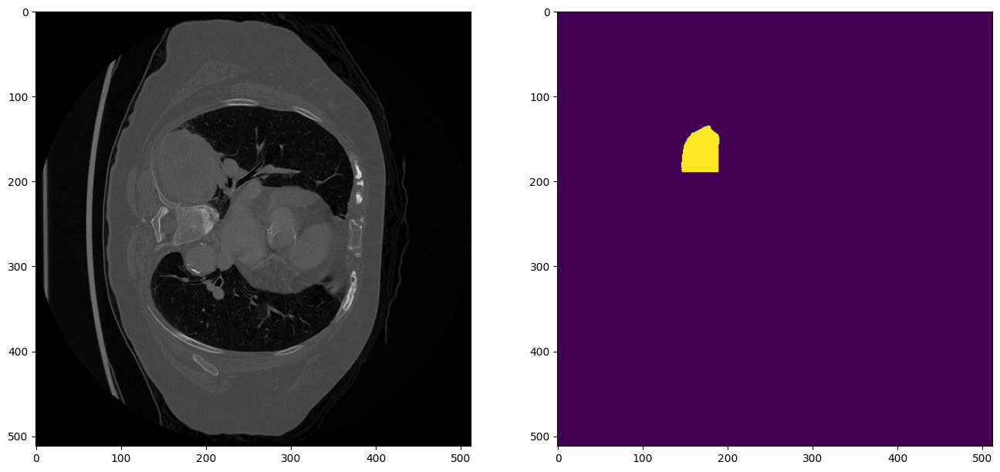

2024-08-28 21:46:58,492 INFO image_writer.py:197 - writing: out/lung_089/lung_089_seg.nii.gz


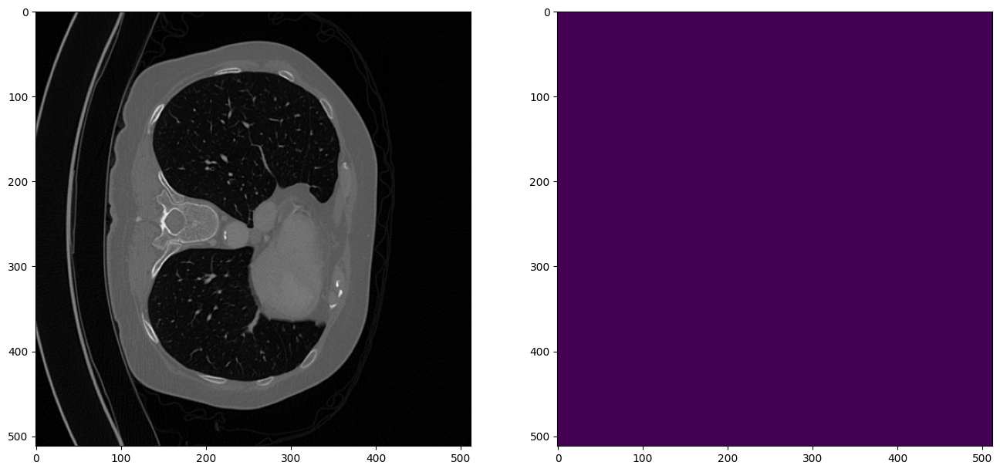

2024-08-28 21:47:08,826 INFO image_writer.py:197 - writing: out/lung_090/lung_090_seg.nii.gz


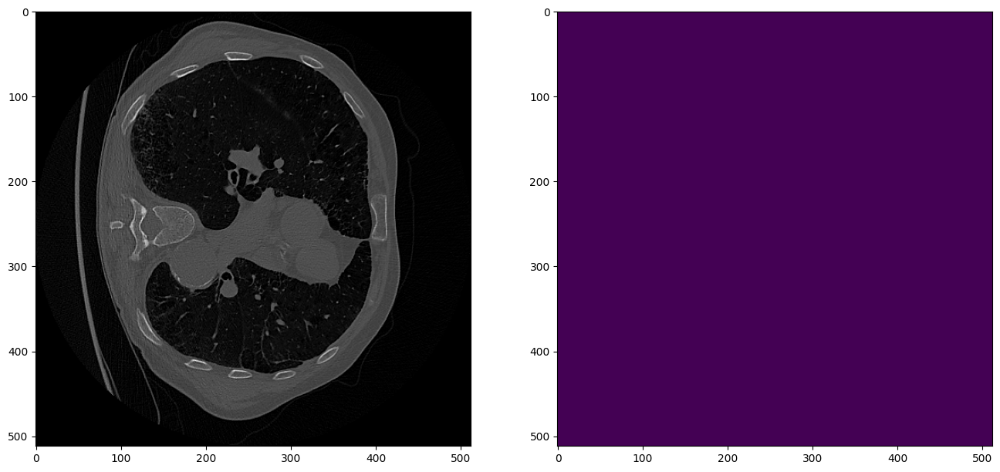

2024-08-28 21:47:17,921 INFO image_writer.py:197 - writing: out/lung_091/lung_091_seg.nii.gz


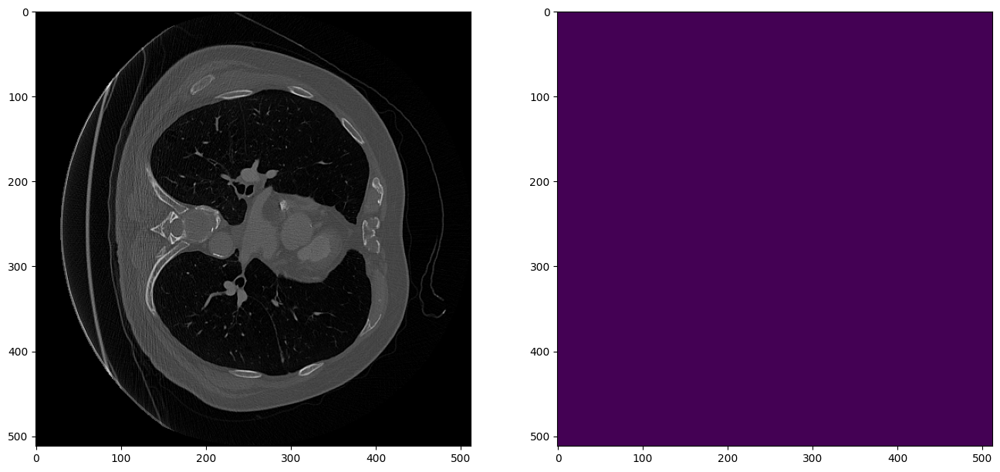

In [72]:
model.load_state_dict(torch.load("/kaggle/working/best_metric_model_trial3_fold5.pth"))
model.eval()

with torch.no_grad():
    for test_data in test_org_loader:
        test_inputs = test_data["image"].to(device)
        roi_size = (160, 160, 160)
        sw_batch_size = 1
        test_data["pred"] = sliding_window_inference(test_inputs, roi_size, sw_batch_size, model)

        test_data = [post_transforms(i) for i in decollate_batch(test_data)]

        test_output = from_engine(["pred"])(test_data)

        original_image = loader(test_output[0].meta["filename_or_obj"])

        plt.figure("check", (16, 16))
        plt.subplot(1, 2, 1)
        plt.imshow(original_image[:, :, 100], cmap="gray")
        plt.subplot(1, 2, 2)
        plt.imshow(test_output[0].detach().cpu()[1, :, :, 100])
        plt.show()

## Cleanup data directory

Remove directory if a temporary was used.

In [ ]:
shutil.rmtree("/kaggle/working/")

**MODEL ARCHITECTURE**

In [83]:

from torchsummary import summary

print(ModifiedUNetWithProjections())


ModifiedUNetWithProjections(
  (unet): UNet(
    (model): Sequential(
      (0): ResidualUnit(
        (conv): Sequential(
          (unit0): Convolution(
            (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
            (adn): ADN(
              (N): BatchNorm3d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (D): Dropout(p=0.2, inplace=False)
              (A): PReLU(num_parameters=1)
            )
          )
          (unit1): Convolution(
            (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
            (adn): ADN(
              (N): BatchNorm3d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (D): Dropout(p=0.2, inplace=False)
              (A): PReLU(num_parameters=1)
            )
          )
          (unit2): Convolution(
            (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
            (ad

In [75]:
!pip install torchsummary

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()
